# Init Library

In [ ]:
!pip install nlp-id
!pip install Sastrawi
!pip install yellowbrick

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 7.9 MB 5.2 MB/s 
     |████████████████████████████████| 7.9 MB 23.4 MB/s 
     |████████████████████████████████| 7.0 MB 13.7 MB/s 
     |████████████████████████████████| 1.5 MB 52.0 MB/s 
  Created wheel for nlp-id: filename=nlp_id-0.1.12.0-py3-none-any.whl size=8074104 sha256=4720bc05d966a4e225829813667cc47658c04bdc357db6c24e43d7771f1da165
  Stored in directory: /root/.cache/pip/wheels/b2/50/48/da59531125bd94f48dfe66140f41d8fd8a4f04062050375013
  Created wheel for nltk: filename=nltk-3.4.5-py3-none-any.whl size=1449924 sha256=ec66d5110831b0192b6fb1e5aad2d3a88258b61fc389c53e56fa0645b9289985
  Stored in directory: /root/.cache/pip/wheels/48/8b/7f/473521e0c731c6566d631b281f323842bbda9bd819eb9a3ead
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9674 sha256=5f4d3d64e211f14260e97f0ec6b01ecf16335395477de945d7c9058efe907dda
  Stored i

In [ ]:
import pandas as pd
import numpy as np
import csv
import re
from tqdm import tqdm
from nlp_id.tokenizer import Tokenizer
from nlp_id.lemmatizer import Lemmatizer 
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory, StopWordRemover, ArrayDictionary
from collections import Counter
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
from yellowbrick.text import FreqDistVisualizer
from yellowbrick.datasets import load_hobbies
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud,STOPWORDS
import nltk
from nltk import sent_tokenize
from nltk import word_tokenize
from gensim.models import Word2Vec
import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.cluster import SpectralClustering

#Preprocessing tweet catatanali07

In [ ]:
data_raw = pd.read_csv('https://raw.githubusercontent.com/kelvin2401/stki/main/catatanali07.csv')
data_raw.head()

,Unnamed: 0,Id,Tweet Time,Url,Tweet Text,Likes Count,Reply Count,Retweet Count,Retweeted Tweet,User Id,User Name,User Location,Follower Count,Following Count,Likes Count.1,Tweets Count
0,0,1580533269728460800,2022-10-13 12:17:51+00:00,https://twitter.com/CatatanAli07/status/158053...,RT @Catatan_ali7: Aku baru main Twitter nih ga...,0,0,8,https://twitter.com/Catatan_ali7/status/158053...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,1580499737479782400,2022-10-13 10:04:36+00:00,https://twitter.com/CatatanAli07/status/158049...,RT @Catatan_ali7: Kalau abis Nonton Bokep SANG...,0,0,2,https://twitter.com/Catatan_ali7/status/158049...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,1580482417223118848,2022-10-13 08:55:46+00:00,https://twitter.com/CatatanAli07/status/158048...,RT @Catatan_ali7: Tanah Milik DKI dari 2012 su...,0,0,4,https://twitter.com/Catatan_ali7/status/158048...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,1580451643471994881,2022-10-13 06:53:29+00:00,https://twitter.com/CatatanAli07/status/158045...,RT @Catatan_ali7: Pengadu domba tukang fitnah ...,0,0,3,https://twitter.com/Catatan_ali7/status/158045...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,1580442623268900865,2022-10-13 06:17:39+00:00,https://twitter.com/CatatanAli07/status/158044...,RT @Catatan_ali7: Bayangkan ketika kamu lagi F...,0,0,10,https://twitter.com/Catatan_ali7/status/157491...,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Import kamus bahasa slang
slang_dict = pd.read_csv('https://raw.githubusercontent.com/kelvin2401/stki/main/slang.txt', delimiter = ";")
#slang_dict_fix = slang_dict.drop_duplicates(subset='slang', keep="last")
dict_slang = dict(slang_dict.values)
print (slang_dict)

          &                                          dan
0         +                                       tambah
1         /                                         atau
2     22nya                                   dua-duanya
3        3m  mencuci tangan memakai masker menjaga jarak
4       7an                                       tujuan
...     ...                                          ...
5592  yyaaa                                           ya
5593      z                                         saja
5594     za                                         saja
5595   zama                                        zaman
5596   zonk                                        bodoh

[5597 rows x 2 columns]


In [ ]:
more_stopword = pd.read_csv('https://raw.githubusercontent.com/kelvin2401/stki/main/more_stopword.txt', delimiter = "\t")
more_stopword = more_stopword["stopword"].tolist()
#more_stopword = dict(more_stopword.values)
print (more_stopword)

['aku', 'amin', 'apa', 'bagaimana', 'bagus', 'bahwa', 'baik', 'bang', 'banyak', 'ben', 'berarti', 'biar', 'buat', 'bukan', 'deh', 'dengan', 'dulu', 'have', 'ia', 'iya', 'jadi', 'jangan', 'jarang', 'kalau', 'kali', 'kalian', 'kamu', 'kan', 'kasih', 'kok', 'ku', 'lah', 'lain', 'lebih', 'life', 'maksud', 'mana', 'mau', 'megapkeliduanrasis', 'memang', 'menjadi', 'morning', 'mungkin', 'nama', 'nya', 'oleh', 'orang', 'pakai', 'paling', 'pernah', 'punya', 'rt', 'sama', 'sangat', 'satu', 'selalu', 'selamat', 'semoga', 'semua', 'sering', 'siapa', 'sih', 'stopword', 'tahu', 'terima', 'terus', 'tetap', 'that', 'user', 'what', 'will', 'your', 'yuk']


##Tambahkan stopwords di more_stopword

In [ ]:
stop_factory = StopWordRemoverFactory()
#more_stopword = ['dengan', 'ia','bahwa','oleh','aku','kamu','bukan','nya','iya','user','sih','jadi','deh','rt','kalau','apa','mau','memang','lah','kok','sama','buat', 'ben', 'orang', 'ku', 'kan', 'yuk',]
#more_stopword = more_stopword + ['jarang','jangan','lebih','sering','sangat','MegaPKeliduan','siapa','megapkeliduanrasis','tahu','semua','terus','lain','dulu','banyak','kalian','mana','bagaimana','pernah','kali','semoga','maksud','biar',
    #                             'banyak','mungkin','punya','tetap','menjadi','selalu','satu','selamat','that','pernah','bagus','pakai','have','what','morning','your','will','paling','berarti',
     #                            'amin','lain']
data_stopword = stop_factory.get_stop_words() + more_stopword # menambah stopword
tokenizer = Tokenizer()

def preprocess(s):
    s = re.sub(r'(\\x[0-9a-fA-Z]{2})', '', s)
  #Remove URL
    s = re.sub(r'https?://\S+|www\.\S+', " ", s)
  #Remove Mentions
    s = re.sub(r'@\w+',' ',s)
  #Remove Punctuation
    s= re.sub(r'[^\w\s\d]',' ',s)
  #Remove Digits
    s = re.sub(r'\d+', ' ', s)
  #Remove HTML tags
    s = re.sub('r<.*?>',' ', s)
  #Remove Hastags
    s = re.sub(r'#\w+', ' ', s)
    s = re.sub(r'[^a-zA-Z]', ' ', s) # remove symbol dan angka
    hasil=[]
    word_token = tokenizer.tokenize(s) #tokenisasi
    for word in word_token:
        word = word.strip().lower()   #case folding
        if word in dict_slang:
            word= dict_slang[word]
        if word not in data_stopword: #stopword removal
          if len(word) > 3:
            #word = lemmatizer.lemmatize(word) #lemmatization
            hasil.append(word)
        else:
            continue
    result_sentence = " ".join(hasil).strip() #penggabungan kata hasil pre prosesing
    #print(result_sentence)
    return result_sentence

In [ ]:
data_raw_baru = data_raw
#Melakukan Proses Pre Prosesing pada Kolom text Dataset 
result_preprocess = []
for i, row in tqdm(data_raw_baru.iterrows(), total=data_raw_baru.shape[0]):
  result_preprocess.append(preprocess(row['Tweet Text']))
'Done!'

100%|██████████| 1364/1364 [00:00<00:00, 5101.52it/s]


'Done!'

In [ ]:
#Menampilkan hasil pre prosesing pada kolom baru yaitu text clean
data_raw_baru['text_clean'] = result_preprocess
data_raw_baru['text_clean']

0             baru main twitter gais sebentar follow back
1                        habis menonton video porno sange
2       tanah milik bayar iuran bukti anies tegas tega...
3       pengadu domba tukang fitnah kayak posting self...
4       bayangkan fitnah ghibahin allah memanggil perg...
                              ...                        
1359                                        lihat chelsea
1360                                               polbek
1361                                   solaria bakmi jowo
1362                                               ahsiap
1363                                       fotoprofilbaru
Name: text_clean, Length: 1364, dtype: object

In [ ]:
train_text = data_raw_baru['text_clean']

In [ ]:
data_raw_baru['tokenized_sents'] = data_raw_baru.apply(lambda row: tokenizer.tokenize(row['text_clean']), axis=1)

In [ ]:
display(data_raw_baru)

,Unnamed: 0,Id,Tweet Time,Url,Tweet Text,Likes Count,Reply Count,Retweet Count,Retweeted Tweet,User Id,User Name,User Location,Follower Count,Following Count,Likes Count.1,Tweets Count,text_clean,tokenized_sents
0,0,1580533269728460800,2022-10-13 12:17:51+00:00,https://twitter.com/CatatanAli07/status/158053...,RT @Catatan_ali7: Aku baru main Twitter nih ga...,0,0,8,https://twitter.com/Catatan_ali7/status/158053...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,baru main twitter gais sebentar follow back,"[baru, main, twitter, gais, sebentar, follow, ..."
1,1,1580499737479782400,2022-10-13 10:04:36+00:00,https://twitter.com/CatatanAli07/status/158049...,RT @Catatan_ali7: Kalau abis Nonton Bokep SANG...,0,0,2,https://twitter.com/Catatan_ali7/status/158049...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,habis menonton video porno sange,"[habis, menonton, video, porno, sange]"
2,2,1580482417223118848,2022-10-13 08:55:46+00:00,https://twitter.com/CatatanAli07/status/158048...,RT @Catatan_ali7: Tanah Milik DKI dari 2012 su...,0,0,4,https://twitter.com/Catatan_ali7/status/158048...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tanah milik bayar iuran bukti anies tegas tega...,"[tanah, milik, bayar, iuran, bukti, anies, teg..."
3,3,1580451643471994881,2022-10-13 06:53:29+00:00,https://twitter.com/CatatanAli07/status/158045...,RT @Catatan_ali7: Pengadu domba tukang fitnah ...,0,0,3,https://twitter.com/Catatan_ali7/status/158045...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,pengadu domba tukang fitnah kayak posting self...,"[pengadu, domba, tukang, fitnah, kayak, postin..."
4,4,1580442623268900865,2022-10-13 06:17:39+00:00,https://twitter.com/CatatanAli07/status/158044...,RT @Catatan_ali7: Bayangkan ketika kamu lagi F...,0,0,10,https://twitter.com/Catatan_ali7/status/157491...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,bayangkan fitnah ghibahin allah memanggil perg...,"[bayangkan, fitnah, ghibahin, allah, memanggil..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1359,1359,1492327822719074307,2022-02-12 02:40:53+00:00,https://twitter.com/CatatanAli07/status/149232...,@komisarisKW Dari pada liat chelsea kak👍,1,1,0,NaN,2.936242e+08,RheinaHerlina,dihatimu,32170.0,12694.0,118487.0,59538.0,lihat chelsea,"[lihat, chelsea]"
1360,1360,1492327648890339328,2022-02-12 02:40:12+00:00,https://twitter.com/CatatanAli07/status/149232...,@NovalAssegaf Bib polbek lagi 😂,4,0,0,NaN,2.438801e+08,NovalAssegaf,لا هنا ولا هناك,68121.0,2880.0,85510.0,2249.0,polbek,[polbek]
1361,1361,1492326259724283908,2022-02-12 02:34:41+00:00,https://twitter.com/CatatanAli07/status/149232...,@ArgentianaA Solaria itu Bakmi jowo 🤣😂,0,0,0,NaN,1.133033e+18,ArgentianaA,Jakarta Capital Region,15704.0,2604.0,5109.0,286695.0,solaria bakmi jowo,"[solaria, bakmi, jowo]"
1362,1362,1492320282346160128,2022-02-12 02:10:55+00:00,https://twitter.com/CatatanAli07/status/149232...,@speechless__99 @Catatan_ali7 Ahsiap,0,0,0,NaN,1.099572e+18,speechless__99,Edge of Universe,13974.0,11304.0,38279.0,47615.0,ahsiap,[ahsiap]


In [ ]:
N = len (data_raw_baru)
processed_text = data_raw_baru['tokenized_sents'].to_numpy()
DF = {}
for i in range(N):
    tokens = processed_text[i]
    for w in tokens:
        try:
            DF[w].add(i)
        except:
            DF[w] = {i}
for i in DF:
    DF[i] = len(DF[i])
def doc_freq(word):
    c = 0
    try:
        c = DF[word]
    except:
        pass
    return c
doc = 0
idf = {}
for i in range(N):
    tokens = processed_text[i]
    counter = Counter(tokens + processed_text[i])
    for token in np.unique(tokens):
        df = doc_freq(token)
        idf[token] = np.log(N/(df+1))
    doc += 1

In [ ]:
display(idf)

{'back': 5.831882477283517,
 'baru': 4.0401230080554615,
 'follow': 5.831882477283517,
 'gais': 6.525029657843462,
 'main': 4.6532274809418706,
 'sebentar': 5.426417369175352,
 'twitter': 5.831882477283517,
 'habis': 5.272266689348094,
 'menonton': 5.1387352967235715,
 'porno': 6.525029657843462,
 'sange': 6.525029657843462,
 'video': 5.426417369175352,
 'anies': 4.327805080507242,
 'bayar': 6.119564549735298,
 'bukti': 6.119564549735298,
 'iuran': 6.525029657843462,
 'jokowi': 4.6532274809418706,
 'milik': 6.119564549735298,
 'tanah': 6.119564549735298,
 'tegas': 6.525029657843462,
 'alquran': 6.525029657843462,
 'ayat': 5.831882477283517,
 'beserta': 6.525029657843462,
 'domba': 6.119564549735298,
 'fitnah': 4.915591745409362,
 'hadits': 6.525029657843462,
 'kayak': 4.915591745409362,
 'pengadu': 6.525029657843462,
 'percum': 6.525029657843462,
 'posting': 6.119564549735298,
 'reminder': 6.525029657843462,
 'self': 6.119564549735298,
 'seribu': 6.525029657843462,
 'tukang': 6.1195645

In [ ]:
print('Sorted array ->', sorted(idf.items(), key=lambda x: x[1], reverse=True))

Sorted array -> [('gais', 6.525029657843462), ('porno', 6.525029657843462), ('sange', 6.525029657843462), ('iuran', 6.525029657843462), ('tegas', 6.525029657843462), ('alquran', 6.525029657843462), ('beserta', 6.525029657843462), ('hadits', 6.525029657843462), ('pengadu', 6.525029657843462), ('percum', 6.525029657843462), ('reminder', 6.525029657843462), ('seribu', 6.525029657843462), ('kesempatan', 6.525029657843462), ('memanggil', 6.525029657843462), ('pergunakan', 6.525029657843462), ('sekedar', 6.525029657843462), ('sesuaikan', 6.525029657843462), ('silakan', 6.525029657843462), ('simpati', 6.525029657843462), ('bermasalah', 6.525029657843462), ('puas', 6.525029657843462), ('berat', 6.525029657843462), ('terbiasa', 6.525029657843462), ('arab', 6.525029657843462), ('berpasangan', 6.525029657843462), ('laiskodat', 6.525029657843462), ('viktor', 6.525029657843462), ('ngartis', 6.525029657843462), ('popularitas', 6.525029657843462), ('star', 6.525029657843462), ('syndrom', 6.5250296578

##Nilai IDF (Inverse Document Frequency), sort descending dan ascending

In [ ]:
display(sorted(idf.items(), key=lambda x: x[1], reverse=True))

[('gais', 6.525029657843462),
 ('porno', 6.525029657843462),
 ('sange', 6.525029657843462),
 ('iuran', 6.525029657843462),
 ('tegas', 6.525029657843462),
 ('alquran', 6.525029657843462),
 ('beserta', 6.525029657843462),
 ('hadits', 6.525029657843462),
 ('pengadu', 6.525029657843462),
 ('percum', 6.525029657843462),
 ('reminder', 6.525029657843462),
 ('seribu', 6.525029657843462),
 ('kesempatan', 6.525029657843462),
 ('memanggil', 6.525029657843462),
 ('pergunakan', 6.525029657843462),
 ('sekedar', 6.525029657843462),
 ('sesuaikan', 6.525029657843462),
 ('silakan', 6.525029657843462),
 ('simpati', 6.525029657843462),
 ('bermasalah', 6.525029657843462),
 ('puas', 6.525029657843462),
 ('berat', 6.525029657843462),
 ('terbiasa', 6.525029657843462),
 ('arab', 6.525029657843462),
 ('berpasangan', 6.525029657843462),
 ('laiskodat', 6.525029657843462),
 ('viktor', 6.525029657843462),
 ('ngartis', 6.525029657843462),
 ('popularitas', 6.525029657843462),
 ('star', 6.525029657843462),
 ('syndrom'

In [ ]:
display(sorted(idf.items(), key=lambda x: x[1], reverse=False))

[('bodoh', 3.5046047716990993),
 ('kepala', 3.8169794567412523),
 ('baru', 4.0401230080554615),
 ('salah', 4.0401230080554615),
 ('anies', 4.327805080507242),
 ('terimakasih', 4.384963494347192),
 ('tanya', 4.445588116163626),
 ('allah', 4.510126637301197),
 ('soal', 4.510126637301197),
 ('indonesia', 4.510126637301197),
 ('uang', 4.510126637301197),
 ('sekarang', 4.579119508788149),
 ('masuk', 4.579119508788149),
 ('makan', 4.579119508788149),
 ('tempeleng', 4.579119508788149),
 ('main', 4.6532274809418706),
 ('jokowi', 4.6532274809418706),
 ('hidup', 4.6532274809418706),
 ('diam', 4.6532274809418706),
 ('sampah', 4.6532274809418706),
 ('suka', 4.6532274809418706),
 ('alhamdulillah', 4.6532274809418706),
 ('jauh', 4.6532274809418706),
 ('bahkan', 4.733270188615407),
 ('tertawa', 4.733270188615407),
 ('malu', 4.733270188615407),
 ('paok', 4.733270188615407),
 ('keluar', 4.733270188615407),
 ('tahi', 4.733270188615407),
 ('lihat', 4.733270188615407),
 ('banget', 4.820281565605037),
 ('b

##Histogram nilai IDF

(array([   2.,    2.,    7.,   24.,   51.,   76.,  273.,  388., 1500.]),
 array([3.50460477, 3.84020754, 4.1758103 , 4.51141307, 4.84701583,
        5.1826186 , 5.51822136, 5.85382413, 6.18942689, 6.52502966]),
 <a list of 9 Patch objects>)

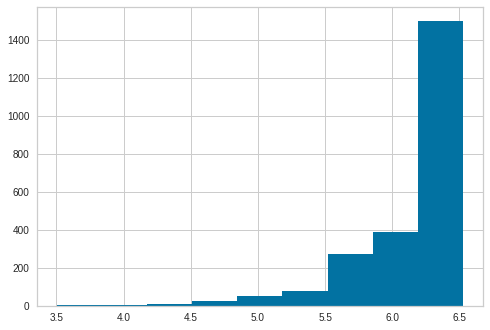

In [ ]:
plt.hist(idf.values(), bins=9)

In [ ]:
N = len (data_raw_baru)
processed_text = data_raw_baru['tokenized_sents'].to_numpy()
DF = {}
for i in range(N):
    tokens = processed_text[i]
    for w in tokens:
        try:
            DF[w].add(i)
        except:
            DF[w] = {i}
for i in DF:
    DF[i] = len(DF[i])
def doc_freq(word):
    c = 0
    try:
        c = DF[word]
    except:
        pass
    return c
doc = 0
df = {}
for i in range(N):
    tokens = processed_text[i]
    counter = Counter(tokens + processed_text[i])
    for token in np.unique(tokens):
        df[token] = doc_freq(token)
    doc += 1

##Histogram nilai DF

(array([2.161e+03, 1.100e+02, 3.700e+01, 1.000e+01, 1.000e+00, 2.000e+00,
        0.000e+00, 1.000e+00, 0.000e+00, 1.000e+00]),
 array([ 1. ,  4.9,  8.8, 12.7, 16.6, 20.5, 24.4, 28.3, 32.2, 36.1, 40. ]),
 <a list of 10 Patch objects>)

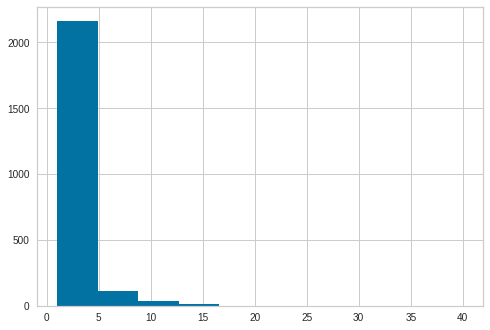

In [ ]:
plt.hist(df.values())

##Nilai DF, sort descending dan ascending

In [ ]:
display(sorted(df.items(), key=lambda x: x[1], reverse=True))

[('bodoh', 40),
 ('kepala', 29),
 ('baru', 23),
 ('salah', 23),
 ('anies', 17),
 ('terimakasih', 16),
 ('tanya', 15),
 ('allah', 14),
 ('soal', 14),
 ('indonesia', 14),
 ('uang', 14),
 ('sekarang', 13),
 ('masuk', 13),
 ('makan', 13),
 ('tempeleng', 13),
 ('main', 12),
 ('jokowi', 12),
 ('hidup', 12),
 ('diam', 12),
 ('sampah', 12),
 ('suka', 12),
 ('alhamdulillah', 12),
 ('jauh', 12),
 ('bahkan', 11),
 ('tertawa', 11),
 ('malu', 11),
 ('paok', 11),
 ('keluar', 11),
 ('tahi', 11),
 ('lihat', 11),
 ('banget', 10),
 ('benar', 10),
 ('bawa', 10),
 ('akun', 10),
 ('tidur', 10),
 ('fitnah', 9),
 ('kayak', 9),
 ('takut', 9),
 ('pendukung', 9),
 ('rasa', 9),
 ('kemarin', 9),
 ('beli', 9),
 ('sekali', 9),
 ('pemain', 9),
 ('ketum', 9),
 ('sini', 9),
 ('dukung', 9),
 ('dan', 9),
 ('lain-lain', 9),
 ('coba', 9),
 ('najis', 9),
 ('keras', 9),
 ('kelakuan', 8),
 ('bapak', 8),
 ('jawab', 8),
 ('waktu', 8),
 ('donasi', 8),
 ('kawan', 8),
 ('tahun', 8),
 ('perlu', 8),
 ('betul', 8),
 ('klaten', 8),
 

In [ ]:
display(sorted(df.items(), key=lambda x: x[1], reverse=False))

[('gais', 1),
 ('porno', 1),
 ('sange', 1),
 ('iuran', 1),
 ('tegas', 1),
 ('alquran', 1),
 ('beserta', 1),
 ('hadits', 1),
 ('pengadu', 1),
 ('percum', 1),
 ('reminder', 1),
 ('seribu', 1),
 ('kesempatan', 1),
 ('memanggil', 1),
 ('pergunakan', 1),
 ('sekedar', 1),
 ('sesuaikan', 1),
 ('silakan', 1),
 ('simpati', 1),
 ('bermasalah', 1),
 ('puas', 1),
 ('berat', 1),
 ('terbiasa', 1),
 ('arab', 1),
 ('berpasangan', 1),
 ('laiskodat', 1),
 ('viktor', 1),
 ('ngartis', 1),
 ('popularitas', 1),
 ('star', 1),
 ('syndrom', 1),
 ('bingu', 1),
 ('ompong', 1),
 ('rutin', 1),
 ('batas', 1),
 ('bertanggung', 1),
 ('melebih', 1),
 ('pelatih', 1),
 ('shin', 1),
 ('yong', 1),
 ('dikanjuruhan', 1),
 ('dikatakan', 1),
 ('empati', 1),
 ('berhijab', 1),
 ('hijab', 1),
 ('konsep', 1),
 ('lepas', 1),
 ('celana', 1),
 ('duluan', 1),
 ('sarungan', 1),
 ('solusi', 1),
 ('susu', 1),
 ('bences', 1),
 ('catatan', 1),
 ('baim', 1),
 ('dikejar', 1),
 ('kejar', 1),
 ('mansyur', 1),
 ('serba', 1),
 ('yusuf', 1),
 ('

In [ ]:
df.items()

dict_items([('back', 3), ('baru', 23), ('follow', 3), ('gais', 1), ('main', 12), ('sebentar', 5), ('twitter', 3), ('habis', 6), ('menonton', 7), ('porno', 1), ('sange', 1), ('video', 5), ('anies', 17), ('bayar', 2), ('bukti', 2), ('iuran', 1), ('jokowi', 12), ('milik', 2), ('tanah', 2), ('tegas', 1), ('alquran', 1), ('ayat', 3), ('beserta', 1), ('domba', 2), ('fitnah', 9), ('hadits', 1), ('kayak', 9), ('pengadu', 1), ('percum', 1), ('posting', 2), ('reminder', 1), ('self', 2), ('seribu', 1), ('tukang', 2), ('allah', 14), ('bayangkan', 2), ('ghibahin', 3), ('hidup', 12), ('kesempatan', 1), ('memanggil', 1), ('pergunakan', 1), ('agama', 6), ('cari', 6), ('cuitan', 6), ('kelakuan', 8), ('pujian', 3), ('sekedar', 1), ('sesuaikan', 1), ('silakan', 1), ('simpati', 1), ('bermasalah', 1), ('emak', 3), ('ikut', 7), ('kompor', 2), ('kurang', 2), ('puas', 1), ('sekarang', 13), ('takut', 9), ('awal', 3), ('berat', 1), ('ghibah', 5), ('merasa', 3), ('terbiasa', 1), ('hujan', 2), ('sayang', 5), ('tu

##Frequency Distribution of Top 50 tokens

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


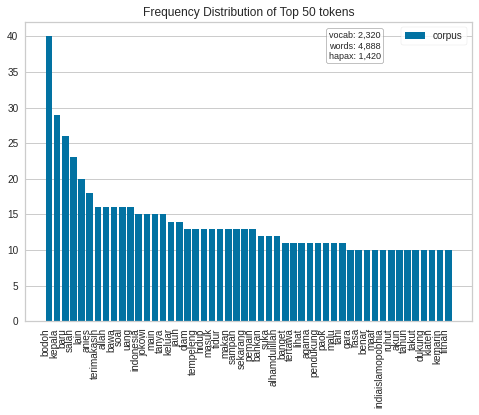

In [ ]:
# Load the text data
corpus = data_raw_baru['text_clean']

vectorizer = CountVectorizer()
docs       = vectorizer.fit_transform(corpus)
features   = vectorizer.get_feature_names()

visualizer = FreqDistVisualizer(features=features, orient='v')
visualizer.fit(docs)
visualizer.show()

In [ ]:
vectorizer = TfidfVectorizer(strip_accents='unicode', analyzer='word', ngram_range=(1,3), norm='l2')
vectorizer.fit(train_text)

TfidfVectorizer(ngram_range=(1, 3), strip_accents='unicode')

In [ ]:
x_train = vectorizer.transform(train_text)

##Word Cloud

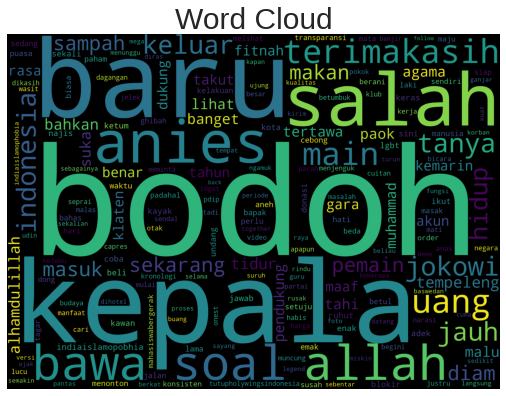

In [ ]:
plt.figure(figsize=(30,20))
subset = data_raw_baru
text = subset.text_clean.values
cloud = WordCloud(
                          stopwords=data_stopword,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))

plt.subplot(2, 3, 1)
plt.axis('off')
plt.title("Word Cloud",fontsize=30)
plt.imshow(cloud)


In [ ]:
catatanali = data_raw_baru

#Preprocessing tweet __bungs

In [ ]:
data_raw = pd.read_csv('https://raw.githubusercontent.com/kelvin2401/stki/main/bungs.csv')
data_raw.head()

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (8) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,Unnamed: 0,Id,Tweet Time,Url,Tweet Text,Likes Count,Reply Count,Retweet Count,Retweeted Tweet,User Id,User Name,User Location,Follower Count,Following Count,Likes Count.1,Tweets Count
0,0,1580480802801930241,2022-10-13 08:49:21+00:00,https://twitter.com/__Bungs/status/15804808028...,📌...👇🏻 https://t.co/zey3JJSZhS https://t.co/Op...,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,1580478948684595201,2022-10-13 08:41:59+00:00,https://twitter.com/__Bungs/status/15804789486...,RT @Pra__93: 🎶When I Fall In Love \n🎙️Nat King...,0,0,5,https://twitter.com/Pra__93/status/15804746885...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,1580475761000992768,2022-10-13 08:29:19+00:00,https://twitter.com/__Bungs/status/15804757610...,Turut prihatin atas musibah ini #prayforbogor ...,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,1580475108920942592,2022-10-13 08:26:44+00:00,https://twitter.com/__Bungs/status/15804751089...,Plipres saja belum tapi udah betpikir negatif ...,2,1,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,1580473714373644288,2022-10-13 08:21:11+00:00,https://twitter.com/__Bungs/status/15804737143...,📌...🫣 https://t.co/d2OyGrskuD https://t.co/Tuh...,4,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
lemmatizer = Lemmatizer()
tokenizer = Tokenizer()

In [ ]:
data_raw_baru = data_raw

In [ ]:
#Melakukan Proses Pre Prosesing pada Kolom text Dataset 
result_preprocess = []
for i, row in tqdm(data_raw_baru.iterrows(), total=data_raw_baru.shape[0]):
  result_preprocess.append(preprocess(row['Tweet Text']))
'Done!'

100%|██████████| 53693/53693 [00:14<00:00, 3830.06it/s]


'Done!'

In [ ]:
#Menampilkan hasil pre prosesing pada kolom baru yaitu text clean
data_raw_baru['text_clean'] = result_preprocess

In [ ]:
data_raw_baru['text_clean']

0                                                      
1                when fall cinta king cole natalie cole
2              turut prihatin atas musibah prayforbogor
3                              plipres betpikir negatif
4                                                      
                              ...                      
53688    jiahhhhhh puterin lagu thank lanjut time bless
53689                         thankss saudara laki-laki
53690          now playing ontheradio request jovi dong
53691                     request lagu jovi thank nadia
53692                                 request lagu dong
Name: text_clean, Length: 53693, dtype: object

In [ ]:
data_raw_baru

,Unnamed: 0,Id,Tweet Time,Url,Tweet Text,Likes Count,Reply Count,Retweet Count,Retweeted Tweet,User Id,User Name,User Location,Follower Count,Following Count,Likes Count.1,Tweets Count,text_clean
0,0,1580480802801930241,2022-10-13 08:49:21+00:00,https://twitter.com/__Bungs/status/15804808028...,📌...👇🏻 https://t.co/zey3JJSZhS https://t.co/Op...,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,
1,1,1580478948684595201,2022-10-13 08:41:59+00:00,https://twitter.com/__Bungs/status/15804789486...,RT @Pra__93: 🎶When I Fall In Love \n🎙️Nat King...,0,0,5,https://twitter.com/Pra__93/status/15804746885...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,when fall cinta king cole natalie cole
2,2,1580475761000992768,2022-10-13 08:29:19+00:00,https://twitter.com/__Bungs/status/15804757610...,Turut prihatin atas musibah ini #prayforbogor ...,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,turut prihatin atas musibah prayforbogor
3,3,1580475108920942592,2022-10-13 08:26:44+00:00,https://twitter.com/__Bungs/status/15804751089...,Plipres saja belum tapi udah betpikir negatif ...,2,1,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,plipres betpikir negatif
4,4,1580473714373644288,2022-10-13 08:21:11+00:00,https://twitter.com/__Bungs/status/15804737143...,📌...🫣 https://t.co/d2OyGrskuD https://t.co/Tuh...,4,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53688,53688,263253146653061120,2012-10-30 12:16:55+00:00,https://twitter.com/__Bungs/status/26325314665...,@nadiagarnett jiahhhhhh ga di puterin lagunya....,0,1,0,NaN,142179695.0,nadiagarnett,NaN,1634.0,311.0,508.0,11126.0,jiahhhhhh puterin lagu thank lanjut time bless
53689,53689,263240579910086656,2012-10-30 11:26:59+00:00,https://twitter.com/__Bungs/status/26324057991...,@cherrybleeds thankss bro..\m/,0,0,0,NaN,256278828.0,cherrybleeds,Jakarta metal banget....,17.0,12.0,0.0,31.0,thankss saudara laki-laki
53690,53690,263238935096995840,2012-10-30 11:20:27+00:00,https://twitter.com/__Bungs/status/26323893509...,"@kisfmjakarta #np #OnTheRadio request ""have a ...",0,1,0,NaN,68998125.0,kis951fm,"Jakarta, Indonesia",130841.0,1591.0,3566.0,273143.0,now playing ontheradio request jovi dong
53691,53691,263232230644658176,2012-10-30 10:53:49+00:00,https://twitter.com/__Bungs/status/26323223064...,"@nadiagarnett request lagu bon jovi yang ""have...",0,0,0,NaN,142179695.0,nadiagarnett,NaN,1634.0,311.0,508.0,11126.0,request lagu jovi thank nadia


In [ ]:
train_text = data_raw_baru['text_clean']

In [ ]:
data_raw_baru['tokenized_sents'] = data_raw_baru.apply(lambda row: tokenizer.tokenize(row['text_clean']), axis=1)
N = len (data_raw_baru)
processed_text = data_raw_baru['tokenized_sents'].to_numpy()
DF = {}
for i in range(N):
    tokens = processed_text[i]
    for w in tokens:
        try:
            DF[w].add(i)
        except:
            DF[w] = {i}
for i in DF:
    DF[i] = len(DF[i])
def doc_freq(word):
    c = 0
    try:
        c = DF[word]
    except:
        pass
    return c
doc = 0
idf = {}
for i in range(N):
    tokens = processed_text[i]
    counter = Counter(tokens + processed_text[i])
    for token in np.unique(tokens):
        df = doc_freq(token)
        idf[token] = np.log(N/(df+1))
    doc += 1

##Nilai IDF

In [ ]:
display(sorted(idf.items(), key=lambda x: x[1], reverse=True))

[('natalie', 10.197890737622709),
 ('prayforbogor', 10.197890737622709),
 ('betpikir', 10.197890737622709),
 ('plipres', 10.197890737622709),
 ('antitesis', 10.197890737622709),
 ('antonim', 10.197890737622709),
 ('komparasi', 10.197890737622709),
 ('pengungkapan', 10.197890737622709),
 ('usik', 10.197890737622709),
 ('begundal', 10.197890737622709),
 ('terpenuhi', 10.197890737622709),
 ('tikuspolitik', 10.197890737622709),
 ('mematahkan', 10.197890737622709),
 ('retwet', 10.197890737622709),
 ('sahaja', 10.197890737622709),
 ('berkelit', 10.197890737622709),
 ('diperbudak', 10.197890737622709),
 ('pliantar', 10.197890737622709),
 ('pemabuk', 10.197890737622709),
 ('nasdrun', 10.197890737622709),
 ('duri', 10.197890737622709),
 ('garang', 10.197890737622709),
 ('ratingnya', 10.197890737622709),
 ('staffnya', 10.197890737622709),
 ('unggulkan', 10.197890737622709),
 ('institusi', 10.197890737622709),
 ('merugi', 10.197890737622709),
 ('marionette', 10.197890737622709),
 ('mema', 10.1978

In [ ]:
display(sorted(idf.items(), key=lambda x: x[1], reverse=False))

[('lord', 2.8970803706090886),
 ('psalm', 3.3600215861047382),
 ('gitu', 3.365937172056854),
 ('cinta', 3.5560560393108402),
 ('bless', 3.616558359408783),
 ('bahagia', 3.8126963386249835),
 ('spirit', 3.8461328010532836),
 ('from', 3.8505015279666988),
 ('john', 3.8654996035441336),
 ('christ', 3.890703457907424),
 ('jesus', 3.9743228978290452),
 ('those', 4.0710215535085235),
 ('they', 4.150518558576431),
 ('when', 4.196475859661559),
 ('because', 4.210183239392439),
 ('heart', 4.216476526368228),
 ('faith', 4.283037292886567),
 ('them', 4.284387731984439),
 ('nomor', 4.291167418969818),
 ('corinthians', 4.293892216296003),
 ('holy', 4.302111440649135),
 ('this', 4.321556497768358),
 ('proverbs', 4.334259562024612),
 ('matthew', 4.342818815420282),
 ('people', 4.357249080249311),
 ('sunday', 4.373366645270379),
 ('give', 4.4125282759740845),
 ('there', 4.472672982246443),
 ('romans', 4.4891207214554685),
 ('kasih', 4.504158598820009),
 ('terima', 4.504158598820009),
 ('always', 4.521

##Histogram IDF

(array([5.0000e+00, 2.6000e+01, 8.3000e+01, 2.2300e+02, 5.2400e+02,
        1.1990e+03, 2.0410e+03, 4.1570e+03, 1.7891e+04]),
 array([ 2.89708037,  3.70828152,  4.51948267,  5.33068383,  6.14188498,
         6.95308613,  7.76428728,  8.57548843,  9.38668959, 10.19789074]),
 <a list of 9 Patch objects>)

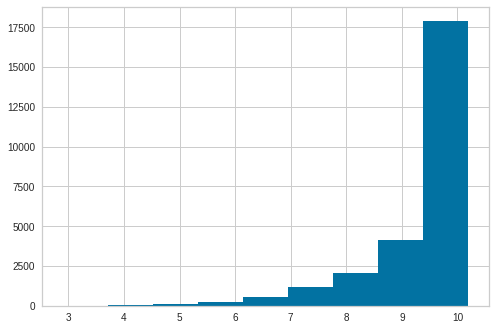

In [ ]:
plt.hist(idf.values(), bins=9)

In [ ]:
N = len (data_raw_baru)
processed_text = data_raw_baru['tokenized_sents'].to_numpy()
DF = {}
for i in range(N):
    tokens = processed_text[i]
    for w in tokens:
        try:
            DF[w].add(i)
        except:
            DF[w] = {i}
for i in DF:
    DF[i] = len(DF[i])
def doc_freq(word):
    c = 0
    try:
        c = DF[word]
    except:
        pass
    return c
doc = 0
df = {}
for i in range(N):
    tokens = processed_text[i]
    counter = Counter(tokens + processed_text[i])
    for token in np.unique(tokens):
        df[token] = doc_freq(token)
    doc += 1

##Histogram DF

(array([2.6064e+04, 5.6000e+01, 1.7000e+01, 7.0000e+00, 1.0000e+00,
        1.0000e+00, 2.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00]),
 array([1.0000e+00, 2.9710e+02, 5.9320e+02, 8.8930e+02, 1.1854e+03,
        1.4815e+03, 1.7776e+03, 2.0737e+03, 2.3698e+03, 2.6659e+03,
        2.9620e+03]),
 <a list of 10 Patch objects>)

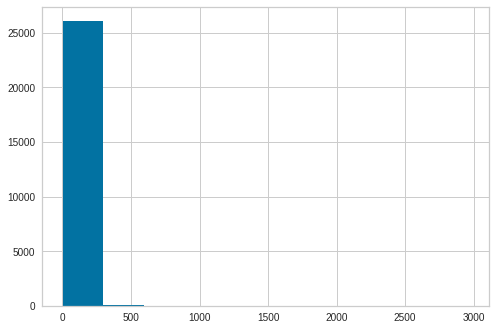

In [ ]:
plt.hist(df.values())

##Nilai DF

In [ ]:
display(sorted(df.items(), key=lambda x: x[1], reverse=True))

[('lord', 2962),
 ('psalm', 1864),
 ('gitu', 1853),
 ('cinta', 1532),
 ('bless', 1442),
 ('bahagia', 1185),
 ('spirit', 1146),
 ('from', 1141),
 ('john', 1124),
 ('christ', 1096),
 ('jesus', 1008),
 ('those', 915),
 ('they', 845),
 ('when', 807),
 ('because', 796),
 ('heart', 791),
 ('faith', 740),
 ('them', 739),
 ('nomor', 734),
 ('corinthians', 732),
 ('holy', 726),
 ('this', 712),
 ('proverbs', 703),
 ('matthew', 697),
 ('people', 687),
 ('sunday', 676),
 ('give', 650),
 ('there', 612),
 ('romans', 602),
 ('kasih', 593),
 ('terima', 593),
 ('always', 583),
 ('come', 573),
 ('keep', 569),
 ('pray', 569),
 ('pagi', 555),
 ('said', 543),
 ('name', 542),
 ('time', 519),
 ('live', 503),
 ('like', 502),
 ('their', 481),
 ('hope', 472),
 ('hebrews', 470),
 ('isaiah', 469),
 ('memakai', 463),
 ('great', 461),
 ('indonesia', 452),
 ('know', 451),
 ('father', 448),
 ('things', 442),
 ('peace', 426),
 ('sehat', 422),
 ('world', 421),
 ('never', 416),
 ('thank', 416),
 ('praise', 402),
 ('thro

In [ ]:
display(sorted(df.items(), key=lambda x: x[1], reverse=False))

[('natalie', 1),
 ('prayforbogor', 1),
 ('betpikir', 1),
 ('plipres', 1),
 ('antitesis', 1),
 ('antonim', 1),
 ('komparasi', 1),
 ('pengungkapan', 1),
 ('usik', 1),
 ('begundal', 1),
 ('terpenuhi', 1),
 ('tikuspolitik', 1),
 ('mematahkan', 1),
 ('retwet', 1),
 ('sahaja', 1),
 ('berkelit', 1),
 ('diperbudak', 1),
 ('pliantar', 1),
 ('pemabuk', 1),
 ('nasdrun', 1),
 ('duri', 1),
 ('garang', 1),
 ('ratingnya', 1),
 ('staffnya', 1),
 ('unggulkan', 1),
 ('institusi', 1),
 ('merugi', 1),
 ('marionette', 1),
 ('mema', 1),
 ('jemanden', 1),
 ('mich', 1),
 ('versteht', 1),
 ('wirklich', 1),
 ('audioslave', 1),
 ('cochise', 1),
 ('bertaring', 1),
 ('hina', 1),
 ('pujaan', 1),
 ('pengangguran', 1),
 ('beyonc', 1),
 ('diarea', 1),
 ('kosmetika', 1),
 ('memoles', 1),
 ('diseti', 1),
 ('iagi', 1),
 ('pendu', 1),
 ('gianni', 1),
 ('infantino', 1),
 ('rabiul', 1),
 ('lelaki', 1),
 ('anggara', 1),
 ('merestorasi', 1),
 ('kasu', 1),
 ('sudjono', 1),
 ('lobsdrun', 1),
 ('pusaran', 1),
 ('similikiti', 1),

##Frequency Distribution

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


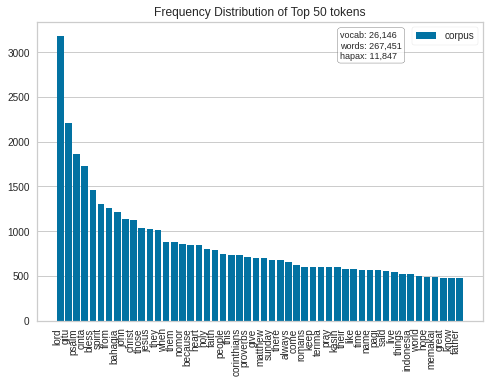

In [ ]:
# Load the text data
corpus = data_raw_baru['text_clean']

vectorizer = CountVectorizer()
docs       = vectorizer.fit_transform(corpus)
features   = vectorizer.get_feature_names()

visualizer = FreqDistVisualizer(features=features, orient='v')
visualizer.fit(docs)
visualizer.show()

In [ ]:
vectorizer = TfidfVectorizer(strip_accents='unicode', analyzer='word', ngram_range=(1,3), norm='l2')
vectorizer.fit(train_text)

TfidfVectorizer(ngram_range=(1, 3), strip_accents='unicode')

In [ ]:
x_train2 = vectorizer.transform(train_text)

##Word Cloud

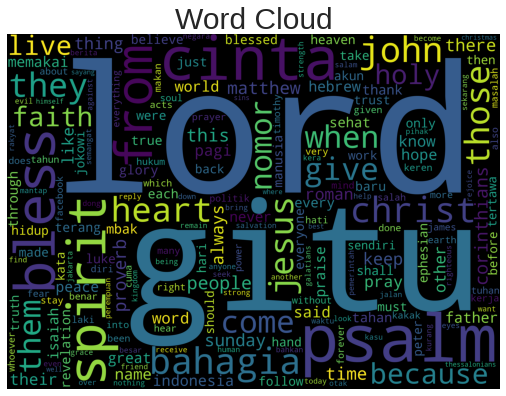

In [ ]:
plt.figure(figsize=(30,20))
subset = data_raw_baru
text = subset.text_clean.values
cloud = WordCloud(
                          stopwords=data_stopword,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))

plt.subplot(2, 3, 1)
plt.axis('off')
plt.title("Word Cloud",fontsize=30)
plt.imshow(cloud)

In [ ]:
bungs = data_raw_baru

#Word embedding catatanali07

In [ ]:
catatanali.head()

,Unnamed: 0,Id,Tweet Time,Url,Tweet Text,Likes Count,Reply Count,Retweet Count,Retweeted Tweet,User Id,User Name,User Location,Follower Count,Following Count,Likes Count.1,Tweets Count,text_clean,tokenized_sents
0,0,1580533269728460800,2022-10-13 12:17:51+00:00,https://twitter.com/CatatanAli07/status/158053...,RT @Catatan_ali7: Aku baru main Twitter nih ga...,0,0,8,https://twitter.com/Catatan_ali7/status/158053...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,baru main twitter gais sebentar follow back,"[baru, main, twitter, gais, sebentar, follow, ..."
1,1,1580499737479782400,2022-10-13 10:04:36+00:00,https://twitter.com/CatatanAli07/status/158049...,RT @Catatan_ali7: Kalau abis Nonton Bokep SANG...,0,0,2,https://twitter.com/Catatan_ali7/status/158049...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,habis menonton video porno sange,"[habis, menonton, video, porno, sange]"
2,2,1580482417223118848,2022-10-13 08:55:46+00:00,https://twitter.com/CatatanAli07/status/158048...,RT @Catatan_ali7: Tanah Milik DKI dari 2012 su...,0,0,4,https://twitter.com/Catatan_ali7/status/158048...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tanah milik bayar iuran bukti anies tegas tega...,"[tanah, milik, bayar, iuran, bukti, anies, teg..."
3,3,1580451643471994881,2022-10-13 06:53:29+00:00,https://twitter.com/CatatanAli07/status/158045...,RT @Catatan_ali7: Pengadu domba tukang fitnah ...,0,0,3,https://twitter.com/Catatan_ali7/status/158045...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,pengadu domba tukang fitnah kayak posting self...,"[pengadu, domba, tukang, fitnah, kayak, postin..."
4,4,1580442623268900865,2022-10-13 06:17:39+00:00,https://twitter.com/CatatanAli07/status/158044...,RT @Catatan_ali7: Bayangkan ketika kamu lagi F...,0,0,10,https://twitter.com/Catatan_ali7/status/157491...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,bayangkan fitnah ghibahin allah memanggil perg...,"[bayangkan, fitnah, ghibahin, allah, memanggil..."


In [ ]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
doc_gensim = [word_tokenize(d) for d in catatanali['text_clean']]

In [ ]:
print(doc_gensim)

[['baru', 'main', 'twitter', 'gais', 'sebentar', 'follow', 'back'], ['habis', 'menonton', 'video', 'porno', 'sange'], ['tanah', 'milik', 'bayar', 'iuran', 'bukti', 'anies', 'tegas', 'tegas', 'jokowi'], ['pengadu', 'domba', 'tukang', 'fitnah', 'kayak', 'posting', 'self', 'reminder', 'beserta', 'hadits', 'ayat', 'alquran', 'seribu', 'percum'], ['bayangkan', 'fitnah', 'ghibahin', 'allah', 'memanggil', 'pergunakan', 'kesempatan', 'hidup'], ['cuitan', 'agama', 'silakan', 'sesuaikan', 'kelakuan', 'sekedar', 'cari', 'simpati', 'pujian'], ['emak', 'emak', 'kurang', 'puas', 'fitnah', 'sekarang', 'bermasalah', 'ikut', 'kompor', 'takut'], ['berat', 'ghibah', 'awal', 'fitnah', 'fitnah', 'ghibah', 'terbiasa', 'ghibah', 'merasa'], ['sayang', 'hujan', 'turun'], ['benci', 'arab', 'puja', 'puji', 'china', 'bodoh'], ['melihat', 'karakter', 'pendukung', 'anies', 'baswedan', 'rasa', 'anies', 'cocok', 'berpasangan', 'viktor', 'laiskodat'], ['mulai', 'ngartis', 'kuat', 'naik', 'popularitas', 'alias', 'star'

In [ ]:
d = 300
model_sg = Word2Vec(doc_gensim, min_count=1, size=d, window=5, workers=-1,)
print("DONE")

DONE


In [ ]:
from gensim.models import FastText

dim = 300 # Jumlah neurons = ukuran vektor = jumlah kolom
model_ft = FastText(doc_gensim, size=dim, window=5, min_count=2, workers=-1)
'Done'

'Done'

##Word embedding chart menggunakan t-SNE

In [ ]:
from sklearn.manifold import TSNE
# getting the embedding vectors
X = model_sg[model_sg.wv.vocab]
# dimentionality reduction using PCA
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300, learning_rate='auto', init='pca')
# running the transformations
result_tsne = tsne.fit_transform(X)
# getting the corresponding words
words = list(model_sg.wv.vocab)

# creating a dataframe from the results
df_tsne = pd.DataFrame(result_tsne, columns=list('XY'))
# adding a columns for the corresponding words
df_tsne['Words'] = words
# converting the lower case text to title case
df_tsne['Words'] = df_tsne['Words'].str.title()

# plotting a scatter plot
fig = px.scatter(df_tsne[:100], x="X", y="Y", text="Words", log_x=True, size_max=60)
# adjusting the text position
fig.update_traces(textposition='top center')
# setting up the height and title
fig.update_layout(
    height=600,
    title_text='Word embedding chart'
)
# displaying the figure
fig.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning:

Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).



[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 2325 samples in 0.002s...
[t-SNE] Computed neighbors for 2325 samples in 0.290s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2325
[t-SNE] Computed conditional probabilities for sample 2000 / 2325
[t-SNE] Computed conditional probabilities for sample 2325 / 2325
[t-SNE] Mean sigma: 0.003398


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



[t-SNE] KL divergence after 250 iterations with early exaggeration: 75.324188
[t-SNE] KL divergence after 300 iterations: 3.698824


In [ ]:
# getting the embedding vectors
X = model_ft[model_ft.wv.vocab]
# dimentionality reduction using PCA
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300, learning_rate='auto', init='pca')
# running the transformations
result_tsne = tsne.fit_transform(X)
# getting the corresponding words
words = list(model_ft.wv.vocab)

# creating a dataframe from the results
df_tsne_ft = pd.DataFrame(result_tsne, columns=list('XY'))
# adding a columns for the corresponding words
df_tsne_ft['Words'] = words
# converting the lower case text to title case
df_tsne_ft['Words'] = df_tsne_ft['Words'].str.title()

# plotting a scatter plot
fig = px.scatter(df_tsne_ft[:100], x="X", y="Y", text="Words", log_x=True, size_max=60)
# adjusting the text position
fig.update_traces(textposition='top center')
# setting up the height and title
fig.update_layout(
    height=600,
    title_text='Word embedding chart'
)
# displaying the figure
fig.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning:

Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).



[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 901 samples in 0.001s...
[t-SNE] Computed neighbors for 901 samples in 0.125s...
[t-SNE] Computed conditional probabilities for sample 901 / 901
[t-SNE] Mean sigma: 0.002412


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



[t-SNE] KL divergence after 250 iterations with early exaggeration: 107.409904
[t-SNE] KL divergence after 300 iterations: 3.105399


##Word embedding chart menggunakan PCA

In [ ]:
# getting the embedding vectors
X = model_sg[model_sg.wv.vocab]
# dimentionality reduction using PCA
pca = PCA(n_components=2)
# running the transformations
result = pca.fit_transform(X)
# getting the corresponding words
words = list(model_sg.wv.vocab)

# creating a dataframe from the results
df = pd.DataFrame(result, columns=list('XY'))
# adding a columns for the corresponding words
df['Words'] = words
# converting the lower case text to title case
df['Words'] = df['Words'].str.title()

# plotting a scatter plot
fig = px.scatter(df[:100], x="X", y="Y", text="Words", log_x=True, size_max=60)
# adjusting the text position
fig.update_traces(textposition='top center')
# setting up the height and title
fig.update_layout(
    height=600,
    title_text='Word embedding chart'
)
# displaying the figure
fig.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning:

Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).



In [ ]:
# getting the embedding vectors
X = model_ft[model_ft.wv.vocab]
# dimentionality reduction using PCA
pca = PCA(n_components=2)
# running the transformations
result = pca.fit_transform(X)
# getting the corresponding words
words = list(model_ft.wv.vocab)

# creating a dataframe from the results
df_pca_ft = pd.DataFrame(result, columns=list('XY'))
# adding a columns for the corresponding words
df_pca_ft['Words'] = words
# converting the lower case text to title case
df_pca_ft['Words'] = df_pca_ft['Words'].str.title()

# plotting a scatter plot
fig = px.scatter(df_pca_ft[:100], x="X", y="Y", text="Words", log_x=True, size_max=60)
# adjusting the text position
fig.update_traces(textposition='top center')
# setting up the height and title
fig.update_layout(
    height=600,
    title_text='Word embedding chart'
)
# displaying the figure
fig.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning:

Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).



#Word embedding __bungs

In [ ]:
bungs.head()

,Unnamed: 0,Id,Tweet Time,Url,Tweet Text,Likes Count,Reply Count,Retweet Count,Retweeted Tweet,User Id,User Name,User Location,Follower Count,Following Count,Likes Count.1,Tweets Count,text_clean,tokenized_sents
0,0,1580480802801930241,2022-10-13 08:49:21+00:00,https://twitter.com/__Bungs/status/15804808028...,📌...👇🏻 https://t.co/zey3JJSZhS https://t.co/Op...,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,[]
1,1,1580478948684595201,2022-10-13 08:41:59+00:00,https://twitter.com/__Bungs/status/15804789486...,RT @Pra__93: 🎶When I Fall In Love \n🎙️Nat King...,0,0,5,https://twitter.com/Pra__93/status/15804746885...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,when fall cinta king cole natalie cole,"[when, fall, cinta, king, cole, natalie, cole]"
2,2,1580475761000992768,2022-10-13 08:29:19+00:00,https://twitter.com/__Bungs/status/15804757610...,Turut prihatin atas musibah ini #prayforbogor ...,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,turut prihatin atas musibah prayforbogor,"[turut, prihatin, atas, musibah, prayforbogor]"
3,3,1580475108920942592,2022-10-13 08:26:44+00:00,https://twitter.com/__Bungs/status/15804751089...,Plipres saja belum tapi udah betpikir negatif ...,2,1,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,plipres betpikir negatif,"[plipres, betpikir, negatif]"
4,4,1580473714373644288,2022-10-13 08:21:11+00:00,https://twitter.com/__Bungs/status/15804737143...,📌...🫣 https://t.co/d2OyGrskuD https://t.co/Tuh...,4,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,[]


In [ ]:
doc_gensim = [word_tokenize(d) for d in bungs['text_clean']]

In [ ]:
print(doc_gensim)

[[], ['when', 'fall', 'cinta', 'king', 'cole', 'natalie', 'cole'], ['turut', 'prihatin', 'atas', 'musibah', 'prayforbogor'], ['plipres', 'betpikir', 'negatif'], [], [], ['antitesis', 'pengungkapan', 'gagasan', 'bertentangan', 'susunan', 'kata', 'sejajar', 'majas', 'antitesis', 'merupakan', 'jenis', 'bahasa', 'kiasan', 'mengadakan', 'komparasi', 'perbandingan', 'lawan', 'kata', 'antonim', 'menimbulkan', 'pertentangan', 'berbeda'], ['jokowi'], ['usik', 'banteng', 'bila', 'dihormati'], ['cara', 'editan', 'receh'], ['kebutuhan', 'terpenuhi', 'analisa', 'berkembang', 'naskah', 'tambahan', 'sinema', 'elektronik', 'sekali', 'tayang', 'begundal', 'akal', 'benalu', 'ikut', 'berperan'], ['rakyat'], ['demokrat', 'urat', 'malu'], ['hukum', 'adat', 'kejahatan', 'korupsi', 'pengacara', 'lukas', 'enembe', 'belajar', 'hukum', 'adat', 'akal', 'menghambat', 'kerja'], ['pembual', 'beri', 'umpan', 'tikuspolitik', 'lahir', 'perbandingan', 'membuat', 'pembual', 'unggul', 'padahal', 'pamer', 'sertifikat'], [

In [ ]:
d = 300
model_sg = Word2Vec(doc_gensim, min_count=1, size=d, window=5, workers=-1,)
print("DONE")

DONE


In [ ]:
dim = 300 # Jumlah neurons = ukuran vektor = jumlah kolom
model_ft = FastText(doc_gensim, size=dim, window=5, min_count=2, workers=-1)
'Done'

'Done'

##Word embedding chart menggunakan t-SNE

In [ ]:
# getting the embedding vectors
X = model_sg[model_sg.wv.vocab]
# dimentionality reduction using PCA
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300, learning_rate='auto', init='pca')
# running the transformations
result_tsne = tsne.fit_transform(X)
# getting the corresponding words
words = list(model_sg.wv.vocab)

# creating a dataframe from the results
df2 = pd.DataFrame(result_tsne, columns=list('XY'))
# adding a columns for the corresponding words
df2['Words'] = words
# converting the lower case text to title case
df2['Words'] = df2['Words'].str.title()

# plotting a scatter plot
fig = px.scatter(df2[:100], x="X", y="Y", text="Words", log_x=True, size_max=60)
# adjusting the text position
fig.update_traces(textposition='top center')
# setting up the height and title
fig.update_layout(
    height=600,
    title_text='Word embedding chart'
)
#fig.update_yaxes(range = [-0.000028,0.000015])
# displaying the figure
fig.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning:

Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).



[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 26158 samples in 0.009s...
[t-SNE] Computed neighbors for 26158 samples in 33.443s...
[t-SNE] Computed conditional probabilities for sample 1000 / 26158
[t-SNE] Computed conditional probabilities for sample 2000 / 26158
[t-SNE] Computed conditional probabilities for sample 3000 / 26158
[t-SNE] Computed conditional probabilities for sample 4000 / 26158
[t-SNE] Computed conditional probabilities for sample 5000 / 26158
[t-SNE] Computed conditional probabilities for sample 6000 / 26158
[t-SNE] Computed conditional probabilities for sample 7000 / 26158
[t-SNE] Computed conditional probabilities for sample 8000 / 26158
[t-SNE] Computed conditional probabilities for sample 9000 / 26158
[t-SNE] Computed conditional probabilities for sample 10000 / 26158
[t-SNE] Computed conditional probabilities for sample 11000 / 26158
[t-SNE] Computed conditional probabilities for sample 12000 / 26158
[t-SNE] Computed conditional probabilities for s

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



[t-SNE] KL divergence after 250 iterations with early exaggeration: 104.040421
[t-SNE] KL divergence after 300 iterations: 5.906741


In [ ]:
# getting the embedding vectors
X = model_ft[model_ft.wv.vocab]
# dimentionality reduction using PCA
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300, learning_rate='auto', init='pca')
# running the transformations
result_tsne = tsne.fit_transform(X)
# getting the corresponding words
words = list(model_ft.wv.vocab)

# creating a dataframe from the results
df2_tsne_ft = pd.DataFrame(result_tsne, columns=list('XY'))
# adding a columns for the corresponding words
df2_tsne_ft['Words'] = words
# converting the lower case text to title case
df2_tsne_ft['Words'] = df2_tsne_ft['Words'].str.title()

# plotting a scatter plot
fig = px.scatter(df2_tsne_ft[:100], x="X", y="Y", text="Words", log_x=True, size_max=60)
# adjusting the text position
fig.update_traces(textposition='top center')
# setting up the height and title
fig.update_layout(
    height=600,
    title_text='Word embedding chart'
)
# displaying the figure
fig.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning:

Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).



[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 14310 samples in 0.006s...
[t-SNE] Computed neighbors for 14310 samples in 8.230s...
[t-SNE] Computed conditional probabilities for sample 1000 / 14310
[t-SNE] Computed conditional probabilities for sample 2000 / 14310
[t-SNE] Computed conditional probabilities for sample 3000 / 14310
[t-SNE] Computed conditional probabilities for sample 4000 / 14310
[t-SNE] Computed conditional probabilities for sample 5000 / 14310
[t-SNE] Computed conditional probabilities for sample 6000 / 14310
[t-SNE] Computed conditional probabilities for sample 7000 / 14310
[t-SNE] Computed conditional probabilities for sample 8000 / 14310
[t-SNE] Computed conditional probabilities for sample 9000 / 14310
[t-SNE] Computed conditional probabilities for sample 10000 / 14310
[t-SNE] Computed conditional probabilities for sample 11000 / 14310
[t-SNE] Computed conditional probabilities for sample 12000 / 14310
[t-SNE] Computed conditional probabilities for sa

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



[t-SNE] KL divergence after 250 iterations with early exaggeration: 128.825851
[t-SNE] KL divergence after 300 iterations: 5.633394


##Word embedding chart menggunakan PCA

In [ ]:
# getting the embedding vectors
X = model_sg[model_sg.wv.vocab]
# dimentionality reduction using PCA
pca = PCA(n_components=2)
# running the transformations
result = pca.fit_transform(X)
# getting the corresponding words
words = list(model_sg.wv.vocab)

# creating a dataframe from the results
df2 = pd.DataFrame(result, columns=list('XY'))
# adding a columns for the corresponding words
df2['Words'] = words
# converting the lower case text to title case
df2['Words'] = df2['Words'].str.title()

# plotting a scatter plot
fig = px.scatter(df2[:100], x="X", y="Y", text="Words", log_x=True, size_max=60)
# adjusting the text position
fig.update_traces(textposition='top center')
# setting up the height and title
fig.update_layout(
    height=600,
    title_text='Word embedding chart'
)
# displaying the figure
fig.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning:

Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).



In [ ]:
# getting the embedding vectors
X = model_ft[model_ft.wv.vocab]
# dimentionality reduction using PCA
pca = PCA(n_components=2)
# running the transformations
result = pca.fit_transform(X)
# getting the corresponding words
words = list(model_ft.wv.vocab)

# creating a dataframe from the results
df2_pca_ft = pd.DataFrame(result, columns=list('XY'))
# adding a columns for the corresponding words
df2_pca_ft['Words'] = words
# converting the lower case text to title case
df2_pca_ft['Words'] = df2_pca_ft['Words'].str.title()

# plotting a scatter plot
fig = px.scatter(df2_pca_ft[:100], x="X", y="Y", text="Words", log_x=True, size_max=60)
# adjusting the text position
fig.update_traces(textposition='top center')
# setting up the height and title
fig.update_layout(
    height=600,
    title_text='Word embedding chart'
)
# displaying the figure
fig.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning:

Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).



In [ ]:
display(df2)

,X,Y,Words
0,-0.000629,0.001706,When
1,0.001374,-0.000637,Fall
2,0.000599,0.000108,Cinta
3,-0.000588,-0.001858,King
4,-0.001024,-0.001598,Cole
...,...,...,...
26153,-0.000812,-0.001549,Sekrt
26154,-0.000098,0.000393,Warehouse
26155,0.000188,0.000308,Grafis
26156,0.000170,0.001914,Sossisssssssssss


#Clustering

##K-Means Clustering

In [ ]:
from sklearn.metrics import silhouette_score as siluet
from sklearn.metrics.cluster import homogeneity_score as purity
from sklearn.metrics import normalized_mutual_info_score as NMI

features = df[['X','Y']]
for i in range(2, 6):
  seed = 99 # Sembarang nilai untuk Random generator, mengapa penting? agar ketika dijalankan ulang nilai randomnya tetap
  km = KMeans(n_clusters=i, init='random', max_iter=300, random_state = seed)
  km.fit(features)

  # Hasil clusteringnya
  C_km = km.predict(features)
 
  print('Jumlah klaster:', i)
  print('Silhouette: ', round(siluet(features, C_km), 4))
  print('')

Jumlah klaster: 2
Silhouette:  0.305

Jumlah klaster: 3
Silhouette:  0.3374

Jumlah klaster: 4
Silhouette:  0.3136

Jumlah klaster: 5
Silhouette:  0.3152



In [ ]:
kmeans = KMeans(n_clusters=3)
features = df[['X','Y']]
kmeans.fit(features)
y_km = kmeans.fit_predict(features)


In [ ]:
features = np.array(features)

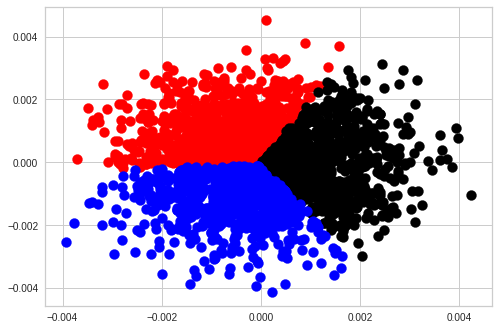

In [ ]:
plt.scatter(features[y_km ==0,0], features[y_km == 0,1], s=100, c='red')
plt.scatter(features[y_km ==1,0], features[y_km == 1,1], s=100, c='black')
plt.scatter(features[y_km ==2,0], features[y_km == 2,1], s=100, c='blue')

In [ ]:
df['y_km'] = y_km

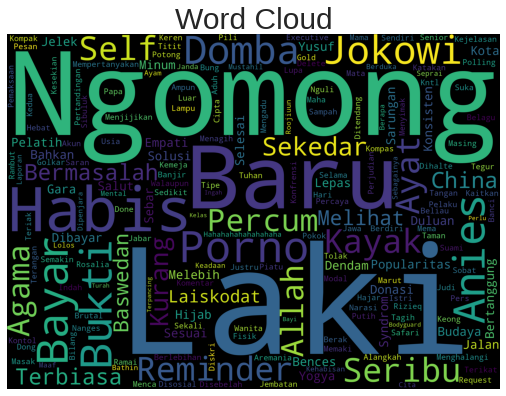

In [ ]:
plt.figure(figsize=(30,20))
subset = df[df.y_km==0]
text = subset.Words.values
cloud_0 = WordCloud(
                          stopwords=data_stopword,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))

plt.subplot(2, 3, 1)
plt.axis('off')
plt.title("Word Cloud",fontsize=30)
plt.imshow(cloud_0)

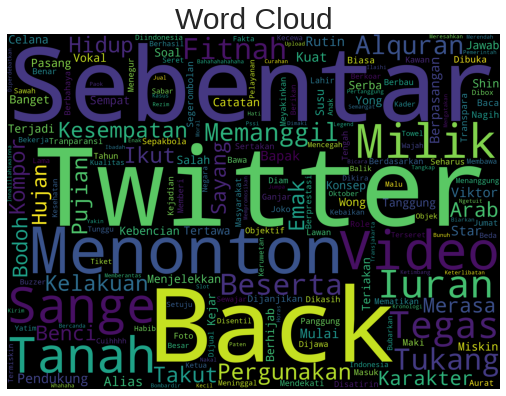

In [ ]:
plt.figure(figsize=(30,20))
subset = df[df.y_km==1]
text = subset.Words.values
cloud_1 = WordCloud(
                          stopwords=data_stopword,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))

plt.subplot(2, 3, 1)
plt.axis('off')
plt.title("Word Cloud",fontsize=30)
plt.imshow(cloud_1)

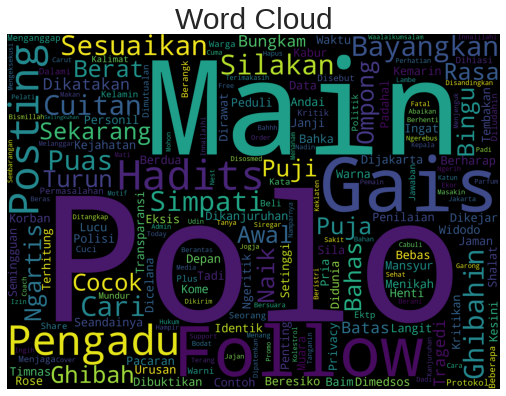

In [ ]:
plt.figure(figsize=(30,20))
subset = df[df.y_km==2]
text = subset.Words.values
cloud_2 = WordCloud(
                          stopwords=data_stopword,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))

plt.subplot(2, 3, 1)
plt.axis('off')
plt.title("Word Cloud",fontsize=30)
plt.imshow(cloud_2)

In [ ]:
kmeans = KMeans(n_clusters=4)
features = df[['X','Y']]
kmeans.fit(features)
y_km = kmeans.fit_predict(features)


In [ ]:
features = np.array(features)

In [ ]:
display(features)

array([[-1.1152047e-04,  7.4762321e-04],
       [ 6.6165820e-05, -1.1429955e-03],
       [ 2.7655452e-03, -3.5593283e-04],
       ...,
       [-8.2669903e-05, -3.1947863e-04],
       [-5.5128342e-04,  9.5398730e-04],
       [-2.2070213e-04, -1.6061479e-03]], dtype=float32)

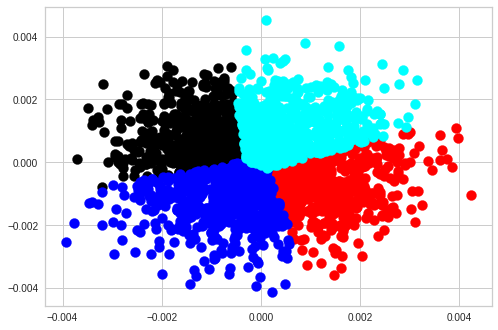

In [ ]:
plt.scatter(features[y_km ==0,0], features[y_km == 0,1], s=100, c='red')
plt.scatter(features[y_km ==1,0], features[y_km == 1,1], s=100, c='black')
plt.scatter(features[y_km ==2,0], features[y_km == 2,1], s=100, c='blue')
plt.scatter(features[y_km ==3,0], features[y_km == 3,1], s=100, c='cyan')

In [ ]:
display(y_km)

array([3, 2, 0, ..., 2, 1, 2], dtype=int32)

In [ ]:
df['y_km'] = y_km

In [ ]:
display(df)

,X,Y,Words,y_km
0,-0.000112,0.000748,Baru,3
1,0.000066,-0.001143,Main,2
2,0.002766,-0.000356,Twitter,0
3,0.000527,-0.000998,Gais,0
4,0.001125,0.001250,Sebentar,3
...,...,...,...,...
2320,-0.000078,-0.002042,Blau,2
2321,0.001005,0.002383,Solaria,3
2322,-0.000083,-0.000319,Bakmi,2
2323,-0.000551,0.000954,Jowo,1


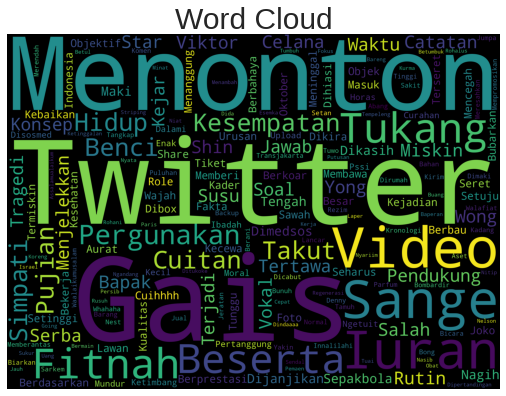

In [ ]:
plt.figure(figsize=(30,20))
subset = df[df.y_km==0]
text = subset.Words.values
cloud_0 = WordCloud(
                          stopwords=data_stopword,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))

plt.subplot(2, 3, 1)
plt.axis('off')
plt.title("Word Cloud",fontsize=30)
plt.imshow(cloud_0)

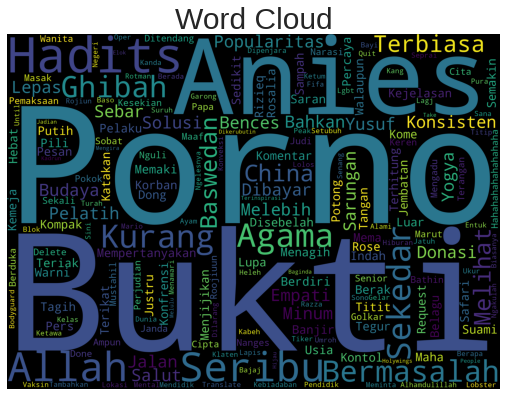

In [ ]:
plt.figure(figsize=(30,20))
subset = df[df.y_km==1]
text = subset.Words.values
cloud_1 = WordCloud(
                          stopwords=data_stopword,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))

plt.subplot(2, 3, 1)
plt.axis('off')
plt.title("Word Cloud",fontsize=30)
plt.imshow(cloud_1)

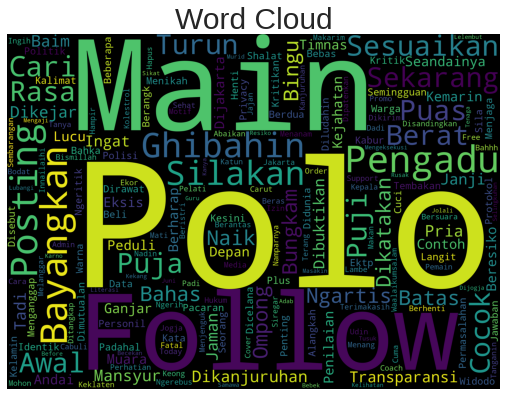

In [ ]:
plt.figure(figsize=(30,20))
subset = df[df.y_km==2]
text = subset.Words.values
cloud_2 = WordCloud(
                          stopwords=data_stopword,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))

plt.subplot(2, 3, 1)
plt.axis('off')
plt.title("Word Cloud",fontsize=30)
plt.imshow(cloud_2)

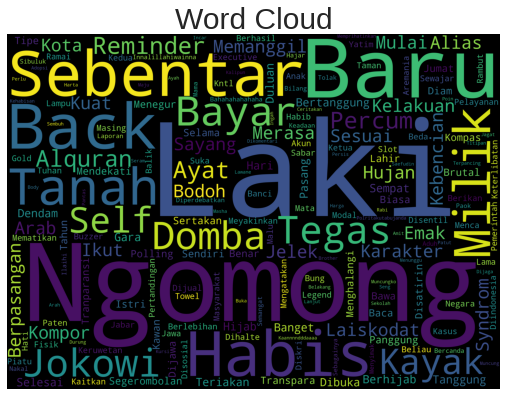

In [ ]:
plt.figure(figsize=(30,20))
subset = df[df.y_km==3]
text = subset.Words.values
cloud_3 = WordCloud(
                          stopwords=data_stopword,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))

plt.subplot(2, 3, 1)
plt.axis('off')
plt.title("Word Cloud",fontsize=30)
plt.imshow(cloud_3)

##Spectral Clustering

In [ ]:
features = df[['X','Y']]
clustering = SpectralClustering(n_clusters=4,
         assign_labels='discretize',
         random_state=0).fit(features)
y_km = clustering.fit_predict(features)


In [ ]:
features = np.array(features)

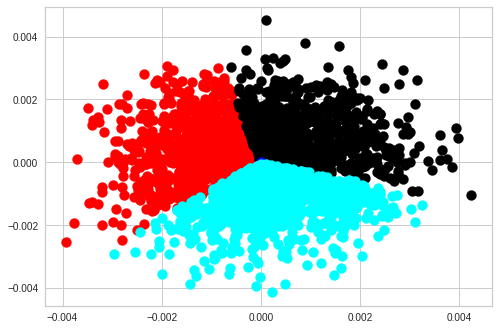

In [ ]:
plt.scatter(features[y_km ==0,0], features[y_km == 0,1], s=100, c='red')
plt.scatter(features[y_km ==1,0], features[y_km == 1,1], s=100, c='black')
plt.scatter(features[y_km ==2,0], features[y_km == 2,1], s=100, c='blue')
plt.scatter(features[y_km ==3,0], features[y_km == 3,1], s=100, c='cyan')

In [ ]:
df['y_km'] = y_km

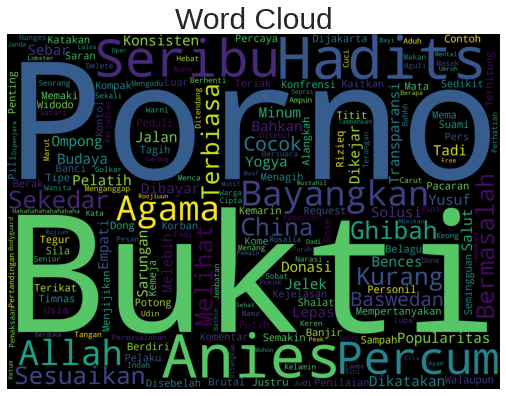

In [ ]:
plt.figure(figsize=(30,20))
subset = df[df.y_km==0]
text = subset.Words.values
cloud_0 = WordCloud(
                          stopwords=data_stopword,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))

plt.subplot(2, 3, 1)
plt.axis('off')
plt.title("Word Cloud",fontsize=30)
plt.imshow(cloud_0)

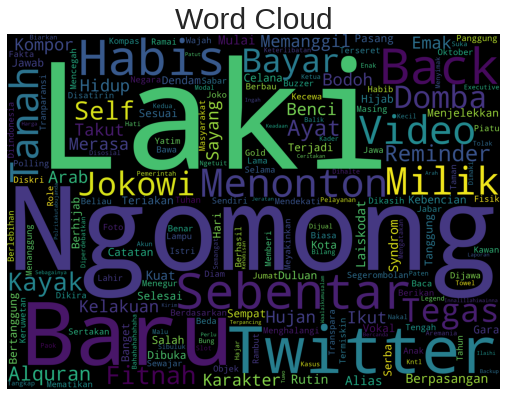

In [ ]:
plt.figure(figsize=(30,20))
subset = df[df.y_km==1]
text = subset.Words.values
cloud_1 = WordCloud(
                          stopwords=data_stopword,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))

plt.subplot(2, 3, 1)
plt.axis('off')
plt.title("Word Cloud",fontsize=30)
plt.imshow(cloud_1)

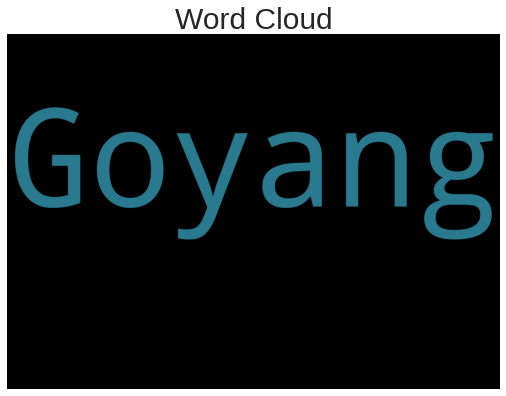

In [ ]:
plt.figure(figsize=(30,20))
subset = df[df.y_km==2]
text = subset.Words.values
cloud_2 = WordCloud(
                          stopwords=data_stopword,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))

plt.subplot(2, 3, 1)
plt.axis('off')
plt.title("Word Cloud",fontsize=30)
plt.imshow(cloud_2)

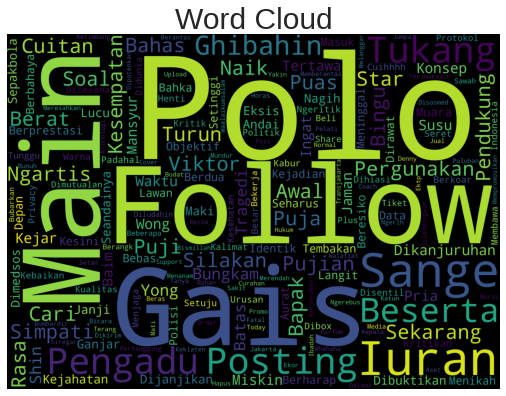

In [ ]:
plt.figure(figsize=(30,20))
subset = df[df.y_km==3]
text = subset.Words.values
cloud_3 = WordCloud(
                          stopwords=data_stopword,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))

plt.subplot(2, 3, 1)
plt.axis('off')
plt.title("Word Cloud",fontsize=30)
plt.imshow(cloud_3)

##K-Means Clustering (t-SNE)

In [ ]:
from sklearn.metrics import silhouette_score as siluet
from sklearn.metrics.cluster import homogeneity_score as purity
from sklearn.metrics import normalized_mutual_info_score as NMI

features = df_tsne[['X','Y']]
for i in range(2, 10):
  seed = 99 # Sembarang nilai untuk Random generator, mengapa penting? agar ketika dijalankan ulang nilai randomnya tetap
  km = KMeans(n_clusters=i, init='random', max_iter=300, random_state = seed)
  km.fit(features)

  # Hasil clusteringnya
  C_km = km.predict(features)
 
  print('Jumlah klaster:', i)
  print('Silhouette: ', round(siluet(features, C_km), 4))
  print('')

Jumlah klaster: 2
Silhouette:  0.3957

Jumlah klaster: 3
Silhouette:  0.4717

Jumlah klaster: 4
Silhouette:  0.5059

Jumlah klaster: 5
Silhouette:  0.5292

Jumlah klaster: 6
Silhouette:  0.413

Jumlah klaster: 7
Silhouette:  0.4126

Jumlah klaster: 8
Silhouette:  0.4076

Jumlah klaster: 9
Silhouette:  0.4122



In [ ]:
kmeans = KMeans(n_clusters=5)
features = df_tsne[['X','Y']]
kmeans.fit(features)
y_km = kmeans.fit_predict(features)


In [ ]:
features = np.array(features)

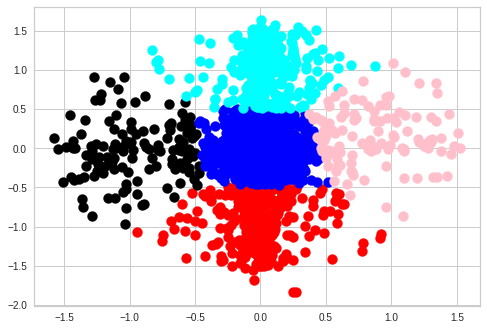

In [ ]:
plt.scatter(features[y_km ==0,0], features[y_km == 0,1], s=100, c='red')
plt.scatter(features[y_km ==1,0], features[y_km == 1,1], s=100, c='black')
plt.scatter(features[y_km ==2,0], features[y_km == 2,1], s=100, c='blue')
plt.scatter(features[y_km ==3,0], features[y_km == 3,1], s=100, c='cyan')
plt.scatter(features[y_km ==4,0], features[y_km == 4,1], s=100, c='pink')

In [ ]:
df_tsne['y_km'] = y_km

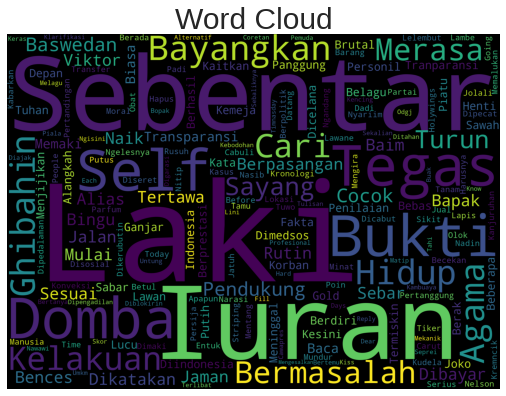

In [ ]:
plt.figure(figsize=(30,20))
subset = df_tsne[df_tsne.y_km==0]
text = subset.Words.values
cloud_0 = WordCloud(
                          stopwords=data_stopword,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))

plt.subplot(2, 3, 1)
plt.axis('off')
plt.title("Word Cloud",fontsize=30)
plt.imshow(cloud_0)

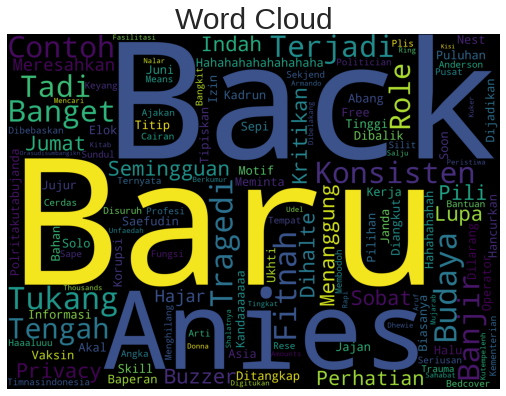

In [ ]:
plt.figure(figsize=(30,20))
subset = df_tsne[df_tsne.y_km==1]
text = subset.Words.values
cloud_1 = WordCloud(
                          stopwords=data_stopword,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))

plt.subplot(2, 3, 1)
plt.axis('off')
plt.title("Word Cloud",fontsize=30)
plt.imshow(cloud_1)

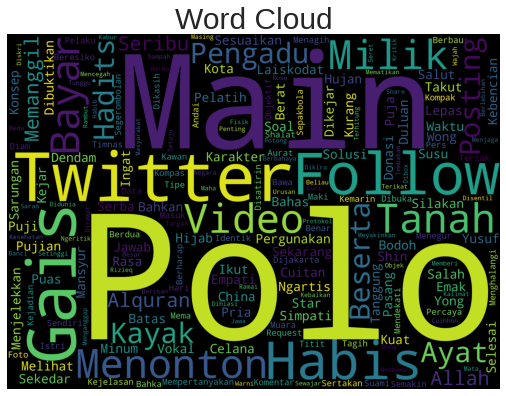

In [ ]:
plt.figure(figsize=(30,20))
subset = df_tsne[df_tsne.y_km==2]
text = subset.Words.values
cloud_2 = WordCloud(
                          stopwords=data_stopword,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))

plt.subplot(2, 3, 1)
plt.axis('off')
plt.title("Word Cloud",fontsize=30)
plt.imshow(cloud_2)

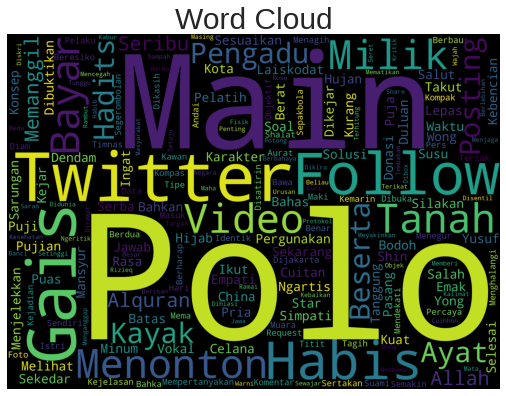

In [ ]:
plt.figure(figsize=(30,20))
subset = df_tsne[df_tsne.y_km==3]
text = subset.Words.values
cloud_3 = WordCloud(
                          stopwords=data_stopword,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))

plt.subplot(2, 3, 1)
plt.axis('off')
plt.title("Word Cloud",fontsize=30)
plt.imshow(cloud_2)

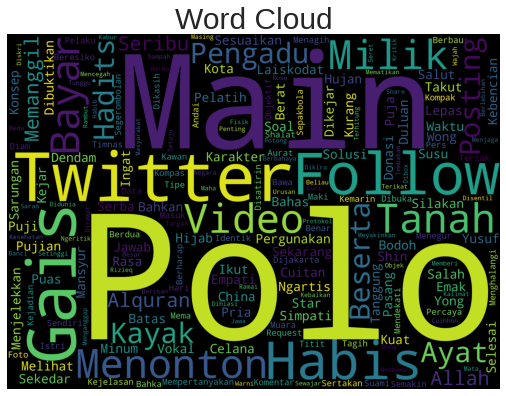

In [ ]:
plt.figure(figsize=(30,20))
subset = df_tsne[df_tsne.y_km==4]
text = subset.Words.values
cloud_4 = WordCloud(
                          stopwords=data_stopword,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))

plt.subplot(2, 3, 1)
plt.axis('off')
plt.title("Word Cloud",fontsize=30)
plt.imshow(cloud_2)

##K-Means Clustering (t-SNE + FastText)

In [ ]:
from sklearn.metrics import silhouette_score as siluet
from sklearn.metrics.cluster import homogeneity_score as purity
from sklearn.metrics import normalized_mutual_info_score as NMI

features = df_tsne_ft[['X','Y']]
for i in range(2, 10):
  seed = 99 # Sembarang nilai untuk Random generator, mengapa penting? agar ketika dijalankan ulang nilai randomnya tetap
  km = KMeans(n_clusters=i, init='random', max_iter=300, random_state = seed)
  km.fit(features)

  # Hasil clusteringnya
  C_km = km.predict(features)
 
  print('Jumlah klaster:', i)
  print('Silhouette: ', round(siluet(features, C_km), 4))
  print('')

Jumlah klaster: 2
Silhouette:  0.3026

Jumlah klaster: 3
Silhouette:  0.3174

Jumlah klaster: 4
Silhouette:  0.3151

Jumlah klaster: 5
Silhouette:  0.3065

Jumlah klaster: 6
Silhouette:  0.3012

Jumlah klaster: 7
Silhouette:  0.3477

Jumlah klaster: 8
Silhouette:  0.3469

Jumlah klaster: 9
Silhouette:  0.3203



In [ ]:
kmeans = KMeans(n_clusters=8)
features = df_tsne_ft[['X','Y']]
kmeans.fit(features)
y_km = kmeans.fit_predict(features)


In [ ]:
features = np.array(features)

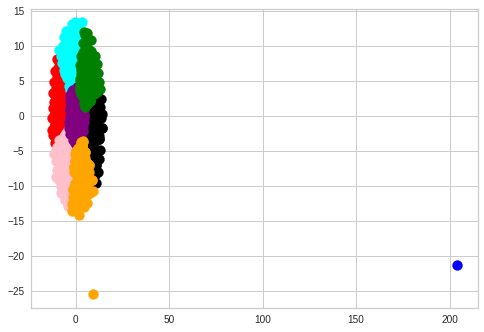

In [ ]:
plt.scatter(features[y_km ==0,0], features[y_km == 0,1], s=100, c='red')
plt.scatter(features[y_km ==1,0], features[y_km == 1,1], s=100, c='black')
plt.scatter(features[y_km ==2,0], features[y_km == 2,1], s=100, c='blue')
plt.scatter(features[y_km ==3,0], features[y_km == 3,1], s=100, c='cyan')
plt.scatter(features[y_km ==4,0], features[y_km == 4,1], s=100, c='pink')
plt.scatter(features[y_km ==5,0], features[y_km == 5,1], s=100, c='purple')
plt.scatter(features[y_km ==6,0], features[y_km == 6,1], s=100, c='green')
plt.scatter(features[y_km ==7,0], features[y_km == 7,1], s=100, c='orange')

In [ ]:
df_tsne_ft['y_km'] = y_km

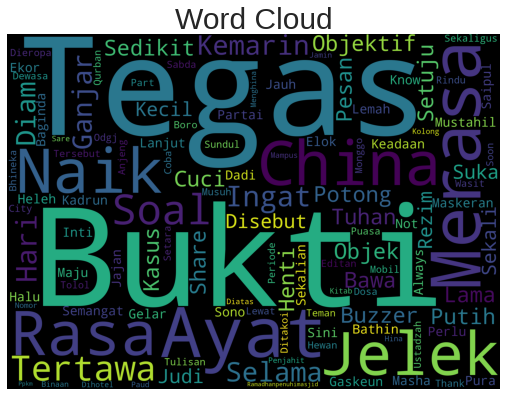

In [ ]:
plt.figure(figsize=(30,20))
subset = df_tsne_ft[df_tsne_ft.y_km==0]
text = subset.Words.values
cloud_0 = WordCloud(
                          stopwords=data_stopword,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))

plt.subplot(2, 3, 1)
plt.axis('off')
plt.title("Word Cloud",fontsize=30)
plt.imshow(cloud_0)

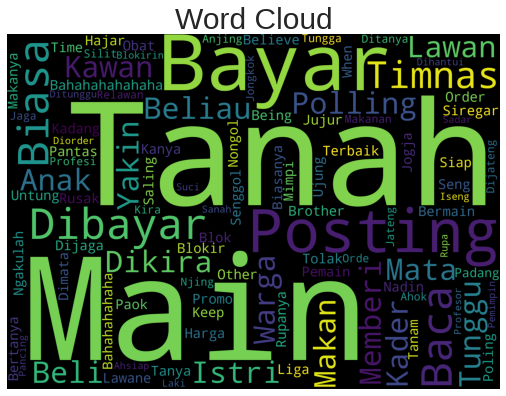

In [ ]:
plt.figure(figsize=(30,20))
subset = df_tsne_ft[df_tsne_ft.y_km==1]
text = subset.Words.values
cloud_1 = WordCloud(
                          stopwords=data_stopword,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))

plt.subplot(2, 3, 1)
plt.axis('off')
plt.title("Word Cloud",fontsize=30)
plt.imshow(cloud_1)

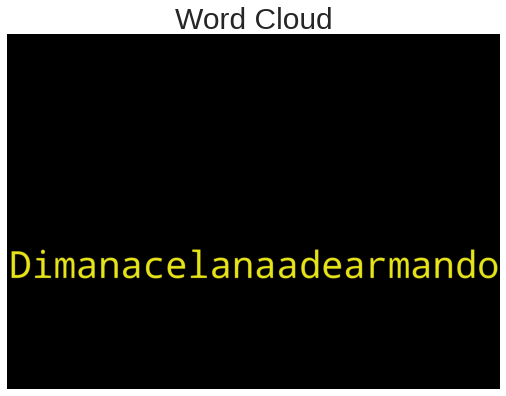

In [ ]:
plt.figure(figsize=(30,20))
subset = df_tsne_ft[df_tsne_ft.y_km==2]
text = subset.Words.values
cloud_2 = WordCloud(
                          stopwords=data_stopword,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))

plt.subplot(2, 3, 1)
plt.axis('off')
plt.title("Word Cloud",fontsize=30)
plt.imshow(cloud_2)

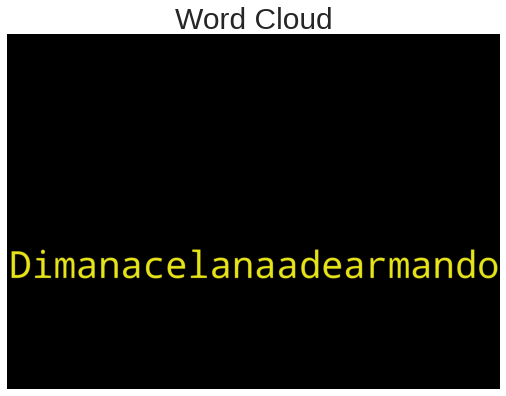

In [ ]:
plt.figure(figsize=(30,20))
subset = df_tsne_ft[df_tsne_ft.y_km==3]
text = subset.Words.values
cloud_3 = WordCloud(
                          stopwords=data_stopword,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))

plt.subplot(2, 3, 1)
plt.axis('off')
plt.title("Word Cloud",fontsize=30)
plt.imshow(cloud_2)

#Topic Modeling

In [ ]:
from gensim import models, corpora

In [ ]:
tokens = [word_tokenize(d) for d in catatanali['text_clean']]
# Build a Dictionary - association word to numeric id
dictionary = corpora.Dictionary(tokens)
 
# Transform the collection of texts to a numerical form
corpus = [dictionary.doc2bow(text) for text in tokens]

In [ ]:
NUM_TOPICS = 4

# Build the LDA model
lda_model = models.LdaModel(corpus=corpus, num_topics=NUM_TOPICS, id2word=dictionary, alpha = 'auto', eval_every=5)#, per_word_topics=True)
 
# Build the LSI model
lsi_model = models.LsiModel(corpus=corpus, num_topics=NUM_TOPICS, id2word=dictionary)

In [ ]:
print("LDA Model:")
 
for idx in range(NUM_TOPICS):
    # Print the first 10 most representative topics
    print("Topic #%s:" % idx, lda_model.print_topic(idx, 10))
 
print("=" * 20)
 
print("LSI Model:")
 
for idx in range(NUM_TOPICS):
    # Print the first 10 most representative topics
    print("Topic #%s:" % idx, lsi_model.print_topic(idx, 10))
 
print("=" * 20)

LDA Model:
Topic #0: 0.006*"bodoh" + 0.006*"baru" + 0.005*"anies" + 0.005*"salah" + 0.004*"jawab" + 0.004*"agama" + 0.003*"dukung" + 0.003*"klaten" + 0.003*"budaya" + 0.003*"keluar"
Topic #1: 0.013*"kepala" + 0.007*"salah" + 0.006*"tanya" + 0.005*"main" + 0.004*"hidup" + 0.004*"tahi" + 0.004*"muhammad" + 0.004*"pemain" + 0.004*"bawa" + 0.003*"baru"
Topic #2: 0.005*"jokowi" + 0.005*"tertawa" + 0.005*"maaf" + 0.004*"allah" + 0.004*"takut" + 0.004*"indiaislamopobhia" + 0.004*"emak" + 0.004*"donasi" + 0.004*"banget" + 0.004*"soal"
Topic #3: 0.014*"bodoh" + 0.006*"makan" + 0.005*"sampah" + 0.005*"tempeleng" + 0.004*"baru" + 0.004*"siap" + 0.004*"tidur" + 0.004*"terimakasih" + 0.004*"ketum" + 0.004*"indonesia"
LSI Model:
Topic #0: -0.636*"muhammad" + -0.279*"nabi" + -0.263*"bodoh" + -0.212*"objek" + -0.207*"muhamad" + -0.187*"dan" + -0.187*"lain-lain" + -0.173*"rasa" + -0.157*"besar" + -0.150*"pantas"
Topic #1: -0.504*"undang" + -0.226*"soal" + -0.194*"jokowi" + -0.187*"periode" + -0.185*"pd

In [ ]:
!pip install pyLDAvis==2.1.2

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.6 MB 5.0 MB/s 
  Created wheel for pyLDAvis: filename=pyLDAvis-2.1.2-py2.py3-none-any.whl size=97738 sha256=6fa573e851baa05e1abf4c6e78f390331fa3f0a9278d519ac71735e48365029d
  Stored in directory: /root/.cache/pip/wheels/3b/fb/41/e32e5312da9f440d34c4eff0d2207b46dc9332a7b931ef1e89
Successfully built pyLDAvis


In [ ]:
import pyLDAvis.gensim
 
pyLDAvis.enable_notebook()
panel = pyLDAvis.gensim.prepare(lda_model, corpus, dictionary)
panel

/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:232: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2      0.113682 -0.023508       1        1  29.945597
0     -0.041796  0.046983       2        1  26.685305
1     -0.060393 -0.089290       3        1  22.752549
3     -0.011493  0.065815       4        1  20.616548, topic_info=           Term       Freq      Total Category  logprob  loglift
506      kepala  20.000000  20.000000  Default  30.0000  30.0000
68        bodoh  26.000000  26.000000  Default  29.0000  29.0000
477       makan   9.000000   9.000000  Default  28.0000  28.0000
807        siap   5.000000   5.000000  Default  27.0000  27.0000
16       jokowi  10.000000  10.000000  Default  26.0000  26.0000
...         ...        ...        ...      ...      ...      ...
509        paok   2.640977   8.124034   Topic4  -5.9425   0.4554
465        suka   2.647573   8.711605   Topic4  -5.9400   0.3881
1197     blokir   2.439291   6.709792   Topic4  -6.0219   0.5672
636      berani   2.332560   5.261984   Topic4  -6.0667   0.7655
78    pendukung   2.448231   8.011295   Topic4  -6.0183   0.3936

[265 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
537       4  0.939472   abaikan
41        1  0.124015     agama
41        2  0.620073     agama
41        3  0.124015     agama
41        4  0.124015     agama
...     ...       ...       ...
455       3  0.737458    wanita
1112      1  0.803072     wasit
1682      1  0.708452  wkwkwkwk
435       2  0.296081     yakin
435       3  0.592162     yakin

[405 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 1, 2, 4])

In [ ]:
NUM_TOPICS = 8

# Build the LDA model
lda_model = models.LdaModel(corpus=corpus, num_topics=NUM_TOPICS, id2word=dictionary, alpha = 'auto', eval_every=5)#, per_word_topics=True)

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(n

In [ ]:
pyLDAvis.enable_notebook()
panel = pyLDAvis.gensim.prepare(lda_model, corpus, dictionary)
panel

/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:232: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
7     -0.074581 -0.061481       1        1  14.936254
0     -0.000442  0.106908       2        1  14.506254
5     -0.070930  0.107945       3        1  13.839688
6     -0.060841 -0.089799       4        1  12.126427
3      0.092687 -0.051006       5        1  12.113531
4      0.078603 -0.010129       6        1  11.821861
2     -0.053960 -0.023684       7        1  10.991714
1      0.089464  0.021247       8        1   9.664272, topic_info=        Term       Freq      Total Category  logprob  loglift
506   kepala  19.000000  19.000000  Default  30.0000  30.0000
1299   tidur   9.000000   9.000000  Default  29.0000  29.0000
1       baru  19.000000  19.000000  Default  28.0000  28.0000
497    tanya  10.000000  10.000000  Default  27.0000  27.0000
68     bodoh  27.000000  27.000000  Default  26.0000  26.0000
...      ...        ...        ...      ...      ...      ...
745   dukung   1.349238   7.449241   Topic8  -5.8564   0.6282
901     time   1.349119   3.275378   Topic8  -5.8565   1.4498
131     tadi   1.349115   4.703434   Topic8  -5.8565   1.0879
144   miskin   1.349017   3.954160   Topic8  -5.8566   1.2613
465     suka   1.349008   8.708923   Topic8  -5.8566   0.4718

[499 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
1130      1  0.145261      adek
1130      3  0.435784      adek
1130      6  0.290523      adek
1130      7  0.145261      adek
515       2  0.370540      aduh
...     ...       ...       ...
1112      4  0.214128     wasit
1177      1  0.294387      when
1177      2  0.588773      when
1026      6  0.737578   wilayah
1682      5  0.747686  wkwkwkwk

[896 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[8, 1, 6, 7, 4, 5, 3, 2])

#Shadow Labeling

In [ ]:
!pip install nlp-id 
!pip install Sastrawi
!pip install wordcloud
!pip install scikit-multilearn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached nlp_id-0.1.12.0-py3-none-any.whl
  Using cached nltk-3.4.5-py3-none-any.whl
  Attempting uninstall: nltk
    Found existing installation: nltk 3.7
    Uninstalling nltk-3.7:
      Successfully uninstalled nltk-3.7
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm
import re
import warnings
warnings.filterwarnings("ignore")
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import Pipeline
from sklearn.multiclass import OneVsRestClassifier
from sklearn.naive_bayes import GaussianNB
from skmultilearn.problem_transform import BinaryRelevance
from skmultilearn.problem_transform import ClassifierChain
from skmultilearn.problem_transform import LabelPowerset
from skmultilearn.adapt import MLkNN
from scipy.sparse import csr_matrix, lil_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn import svm
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score

In [ ]:
data_raw = pd.read_csv('datasetcoba.csv')
#data_raw = data_raw.loc[np.random.choice(data_raw.index, size=2000)]
data_raw.shape

(900, 8)

In [ ]:
missing_values_check = data_raw.isnull().sum()
print(missing_values_check)

Tweet     0
KS       35
KH       35
DH       35
TDH      35
SWA      35
LO       35
AK       36
dtype: int64


In [ ]:
data_raw_baru=data_raw.dropna(axis=0)

In [ ]:
categories = list(data_raw_baru.columns.values)
categories = categories[1:]
print(categories)

['KS', 'KH', 'DH', 'TDH', 'SWA', 'LO', 'AK']


In [ ]:
# Import kamus bahasa slang
slang_dict = pd.read_csv('https://raw.githubusercontent.com/kelvin2401/stki/main/slang.txt', delimiter = ";")
dict_slang = dict(slang_dict.values)
print (slang_dict)

          &                                          dan
0         +                                       tambah
1         /                                         atau
2     22nya                                   dua-duanya
3        3m  mencuci tangan memakai masker menjaga jarak
4       7an                                       tujuan
...     ...                                          ...
5592  yyaaa                                           ya
5593      z                                         saja
5594     za                                         saja
5595   zama                                        zaman
5596   zonk                                        bodoh

[5597 rows x 2 columns]


In [ ]:
# https://github.com/kumparan/nlp-id
from nlp_id.tokenizer import Tokenizer
from nlp_id.lemmatizer import Lemmatizer 

lemmatizer = Lemmatizer()
tokenizer = Tokenizer()

In [ ]:
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory, StopWordRemover, ArrayDictionary
stop_factory = StopWordRemoverFactory()
more_stopword = ['dengan', 'ia','bahwa','oleh','aku','kamu','bukan','nya','iya','user','sih','jadi','deh','rt','kalau','apa','mau','memang']
data_stopword = stop_factory.get_stop_words() + more_stopword # menambah stopword

def preprocess(s):
    s = re.sub(r'(\\x[0-9a-fA-Z]{2})', '', s)
  #Remove URL
    s = re.sub(r'https?://\S+|www\.\S+', " ", s)
  #Remove Mentions
    s = re.sub(r'@\w+',' ',s)
  #Remove Punctuation
    s= re.sub(r'[^\w\s\d]',' ',s)
  #Remove Digits
    s = re.sub(r'\d+', ' ', s)
  #Remove HTML tags
    s = re.sub('r<.*?>',' ', s)
  #Remove Hastags
    s = re.sub(r'#\w+', ' ', s)
    s = re.sub(r'[^a-zA-Z]', ' ', s) # remove symbol dan angka
    hasil=[]
    word_token = tokenizer.tokenize(s) #tokenisaai
    for word in word_token:
        word = word.strip().lower()   #case folding
        if word in dict_slang:
            word= dict_slang[word]
        if word not in data_stopword: #stopword removal
            word = lemmatizer.lemmatize(word) #lemmatization
            hasil.append(word)
        else:
            continue
    result_sentence = " ".join(hasil).strip() #penggabungan kata hasil pre prosesing
    #print(result_sentence)
    return result_sentence

In [ ]:
#Melakukan Proses Pre Prosesing pada Kolom text Dataset 
result_preprocess = []
for i, row in tqdm(data_raw_baru.iterrows(), total=data_raw_baru.shape[0]):
  result_preprocess.append(preprocess(row['Tweet']))
'Done!'

100%|██████████| 864/864 [00:00<00:00, 1773.97it/s]


'Done!'

In [ ]:
#Menampilkan hasil pre prosesing pada kolom baru yaitu text clean
data_raw_baru['text_clean'] = result_preprocess

In [ ]:
data_raw_baru['text_clean']

0                    salah jokowi ahok kafir kafir ateis
1      biar biar tahi kena bapak loh kan suka sama ah...
2      prestasi ahok mjadi mafia koruptor nista agama...
3      ulama kompak nyata haram pimpin kafir pilih ah...
4      dik tinggi bodoh larang bawa agama biar orang ...
                             ...                        
892                                          wasit picek
893    orang kaya indonesia orang indonesia orang cin...
896           manusia berkelakuan cebong hina marah hina
897     media pura bego ajak bego orang nama bodoh parah
899                                            wong gila
Name: text_clean, Length: 864, dtype: object

In [ ]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(data_raw_baru, random_state=42, test_size=0.25, shuffle=True)

print(train.shape)
print(test.shape)

(648, 9)
(216, 9)


In [ ]:
train_text = train['text_clean']
test_text = test['text_clean']

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(strip_accents='unicode', analyzer='word', ngram_range=(1,3), norm='l2')
vectorizer.fit(train_text)
vectorizer.fit(test_text)

TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
                dtype=<class 'numpy.float64'>, encoding='utf-8',
                input='content', lowercase=True, max_df=1.0, max_features=None,
                min_df=1, ngram_range=(1, 3), norm='l2', preprocessor=None,
                smooth_idf=True, stop_words=None, strip_accents='unicode',
                sublinear_tf=False, token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, use_idf=True, vocabulary=None)

In [ ]:
x_train = vectorizer.transform(train_text)
y_train = train.drop(labels = ['Tweet','text_clean'], axis=1)

x_test = vectorizer.transform(test_text)
y_test = test.drop(labels = ['Tweet','text_clean'], axis=1)

In [ ]:
from sklearn.ensemble import BaggingClassifier
from skmultilearn.problem_transform import ClassifierChain
from sklearn.metrics import multilabel_confusion_matrix
import numpy as np
from sklearn.metrics import hamming_loss
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report

bagClassifier = ClassifierChain(BaggingClassifier(n_jobs=-1))
bagClassifier.fit(x_train, y_train)
bagPreds = bagClassifier.predict(x_test)

In [ ]:
label_names = ['Konteks Sosial', 'Konteks Historis', 'Dehumanisasi', 'Tuduhan Negatif', 'Serangan Pada Wanita', 'Mempertanyakan Grup', 'Ancaman Kelompok']
# accuracy
print("Accuracy = ",accuracy_score(y_test,bagPreds))
print("\n")
f1_score_macro = f1_score(y_test, bagPreds, average='macro')
print('f1_score_macro : ',f1_score_macro)
print("\n")
f1_score_micro = f1_score(y_test, bagPreds, average='micro')
print('f1_score_micro : ',f1_score_micro)
print("\n")
f1_score_weighted = f1_score(y_test, bagPreds, average='weighted')
print('f1_score_weighted : ',f1_score_weighted)
print("\n")
print(classification_report(y_test, bagPreds,target_names=label_names))
print("\n")
multilabel_confusion_matrix(y_test, bagPreds)

Accuracy =  0.32407407407407407


f1_score_macro :  0.3810535951928773


f1_score_micro :  0.6722222222222223


f1_score_weighted :  0.6445128809527088


                      precision    recall  f1-score   support

      Konteks Sosial       0.89      0.48      0.62       113
    Konteks Historis       0.64      0.26      0.37        27
        Dehumanisasi       0.65      0.32      0.43        75
     Tuduhan Negatif       0.82      0.86      0.84       173
Serangan Pada Wanita       0.00      0.00      0.00         1
 Mempertanyakan Grup       0.00      0.00      0.00         1
    Ancaman Kelompok       0.62      0.31      0.41        26

           micro avg       0.80      0.58      0.67       416
           macro avg       0.51      0.32      0.38       416
        weighted avg       0.78      0.58      0.64       416
         samples avg       0.78      0.61      0.65       416





array([[[ 96,   7],
        [ 59,  54]],

       [[185,   4],
        [ 20,   7]],

       [[128,  13],
        [ 51,  24]],

       [[ 10,  33],
        [ 24, 149]],

       [[215,   0],
        [  1,   0]],

       [[215,   0],
        [  1,   0]],

       [[185,   5],
        [ 18,   8]]])

In [ ]:
data_raw = pd.read_csv('https://raw.githubusercontent.com/kelvin2401/stki/main/catatanali07.csv')
data_raw.head()

,Unnamed: 0,Id,Tweet Time,Url,Tweet Text,Likes Count,Reply Count,Retweet Count,Retweeted Tweet,User Id,User Name,User Location,Follower Count,Following Count,Likes Count.1,Tweets Count
0,0,1580533269728460800,2022-10-13 12:17:51+00:00,https://twitter.com/CatatanAli07/status/158053...,RT @Catatan_ali7: Aku baru main Twitter nih ga...,0,0,8,https://twitter.com/Catatan_ali7/status/158053...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,1580499737479782400,2022-10-13 10:04:36+00:00,https://twitter.com/CatatanAli07/status/158049...,RT @Catatan_ali7: Kalau abis Nonton Bokep SANG...,0,0,2,https://twitter.com/Catatan_ali7/status/158049...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,1580482417223118848,2022-10-13 08:55:46+00:00,https://twitter.com/CatatanAli07/status/158048...,RT @Catatan_ali7: Tanah Milik DKI dari 2012 su...,0,0,4,https://twitter.com/Catatan_ali7/status/158048...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,1580451643471994881,2022-10-13 06:53:29+00:00,https://twitter.com/CatatanAli07/status/158045...,RT @Catatan_ali7: Pengadu domba tukang fitnah ...,0,0,3,https://twitter.com/Catatan_ali7/status/158045...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,1580442623268900865,2022-10-13 06:17:39+00:00,https://twitter.com/CatatanAli07/status/158044...,RT @Catatan_ali7: Bayangkan ketika kamu lagi F...,0,0,10,https://twitter.com/Catatan_ali7/status/157491...,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
cols = ['Tweet Text']

In [ ]:
data_raw = data_raw[cols]

In [ ]:
data_raw.shape

(1364, 1)

In [ ]:
data_raw.head()

,Tweet Text
0,RT @Catatan_ali7: Aku baru main Twitter nih ga...
1,RT @Catatan_ali7: Kalau abis Nonton Bokep SANG...
2,RT @Catatan_ali7: Tanah Milik DKI dari 2012 su...
3,RT @Catatan_ali7: Pengadu domba tukang fitnah ...
4,RT @Catatan_ali7: Bayangkan ketika kamu lagi F...


In [ ]:
data_raw.rename(columns = {'Tweet Text':'Tweet'}, inplace = True)

In [ ]:
data_raw_baru = data_raw_baru.append(data_raw)

In [ ]:
data_raw_baru.shape

(2228, 8)

In [ ]:
data_raw_baru.head()

,Tweet,KS,KH,DH,TDH,SWA,LO,AK
0,Ini pasti salah Jokowi Ahok dan kafir-kafir at...,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1,@fahmiabuazzam1 biar aja biar tai nya kena bap...,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,RT @Lupuz0503: Prestasi Ahok Selain mjadi mafi...,1.0,0.0,1.0,1.0,0.0,0.0,0.0
3,Ulama Kompak Nyatakan Haram Pemimpin Kafir Pil...,1.0,1.0,0.0,1.0,0.0,0.0,1.0
4,KAU PENDIKAN TINGGI TAPI BODOH....GK ADA LARAN...,1.0,0.0,0.0,1.0,0.0,0.0,0.0


In [ ]:
# Import kamus bahasa slang
slang_dict = pd.read_csv('https://raw.githubusercontent.com/kelvin2401/stki/main/slang.txt', delimiter = ";")
dict_slang = dict(slang_dict.values)
print (slang_dict)

          &                                          dan
0         +                                       tambah
1         /                                         atau
2     22nya                                   dua-duanya
3        3m  mencuci tangan memakai masker menjaga jarak
4       7an                                       tujuan
...     ...                                          ...
5592  yyaaa                                           ya
5593      z                                         saja
5594     za                                         saja
5595   zama                                        zaman
5596   zonk                                        bodoh

[5597 rows x 2 columns]


In [ ]:
# https://github.com/kumparan/nlp-id
from nlp_id.tokenizer import Tokenizer
from nlp_id.lemmatizer import Lemmatizer 

lemmatizer = Lemmatizer()
tokenizer = Tokenizer()

In [ ]:
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory, StopWordRemover, ArrayDictionary
stop_factory = StopWordRemoverFactory()
more_stopword = ['dengan', 'ia','bahwa','oleh','aku','kamu','bukan','nya','iya','user','sih','jadi','deh','rt','kalau','apa','mau','memang']
data_stopword = stop_factory.get_stop_words() + more_stopword # menambah stopword

def preprocess(s):
    s = re.sub(r'(\\x[0-9a-fA-Z]{2})', '', s)
  #Remove URL
    s = re.sub(r'https?://\S+|www\.\S+', " ", s)
  #Remove Mentions
    s = re.sub(r'@\w+',' ',s)
  #Remove Punctuation
    s= re.sub(r'[^\w\s\d]',' ',s)
  #Remove Digits
    s = re.sub(r'\d+', ' ', s)
  #Remove HTML tags
    s = re.sub('r<.*?>',' ', s)
  #Remove Hastags
    s = re.sub(r'#\w+', ' ', s)
    s = re.sub(r'[^a-zA-Z]', ' ', s) # remove symbol dan angka
    hasil=[]
    word_token = tokenizer.tokenize(s) #tokenisaai
    for word in word_token:
        word = word.strip().lower()   #case folding
        if word in dict_slang:
            word= dict_slang[word]
        if word not in data_stopword: #stopword removal
            word = lemmatizer.lemmatize(word) #lemmatization
            hasil.append(word)
        else:
            continue
    result_sentence = " ".join(hasil).strip() #penggabungan kata hasil pre prosesing
    #print(result_sentence)
    return result_sentence

In [ ]:
#Melakukan Proses Pre Prosesing pada Kolom text Dataset 
result_preprocess = []
for i, row in tqdm(data_raw_baru.iterrows(), total=data_raw_baru.shape[0]):
  result_preprocess.append(preprocess(row['Tweet']))
'Done!'

100%|██████████| 2228/2228 [00:02<00:00, 1094.07it/s]


'Done!'

In [ ]:
#Menampilkan hasil pre prosesing pada kolom baru yaitu text clean
data_raw_baru['text_clean'] = result_preprocess

In [ ]:
data_raw_baru['text_clean']

0                     salah jokowi ahok kafir kafir ateis
1       biar biar tahi kena bapak loh kan suka sama ah...
2       prestasi ahok mjadi mafia koruptor nista agama...
3       ulama kompak nyata haram pimpin kafir pilih ah...
4       dik tinggi bodoh larang bawa agama biar orang ...
                              ...                        
1359                                    lihat chelsea kak
1360                                           bib polbek
1361                                   solaria bakmi jowo
1362                                               ahsiap
1363                                       fotoprofilbaru
Name: text_clean, Length: 2228, dtype: object

In [ ]:
display(data_raw_baru)

,Tweet,KS,KH,DH,TDH,SWA,LO,AK,text_clean
0,Ini pasti salah Jokowi Ahok dan kafir-kafir at...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,salah jokowi ahok kafir kafir ateis
1,@fahmiabuazzam1 biar aja biar tai nya kena bap...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,biar biar tahi kena bapak loh kan suka sama ah...
2,RT @Lupuz0503: Prestasi Ahok Selain mjadi mafi...,1.0,0.0,1.0,1.0,0.0,0.0,0.0,prestasi ahok mjadi mafia koruptor nista agama...
3,Ulama Kompak Nyatakan Haram Pemimpin Kafir Pil...,1.0,1.0,0.0,1.0,0.0,0.0,1.0,ulama kompak nyata haram pimpin kafir pilih ah...
4,KAU PENDIKAN TINGGI TAPI BODOH....GK ADA LARAN...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,dik tinggi bodoh larang bawa agama biar orang ...
...,...,...,...,...,...,...,...,...,...
1359,@komisarisKW Dari pada liat chelsea kak👍,NaN,NaN,NaN,NaN,NaN,NaN,NaN,lihat chelsea kak
1360,@NovalAssegaf Bib polbek lagi 😂,NaN,NaN,NaN,NaN,NaN,NaN,NaN,bib polbek
1361,@ArgentianaA Solaria itu Bakmi jowo 🤣😂,NaN,NaN,NaN,NaN,NaN,NaN,NaN,solaria bakmi jowo
1362,@speechless__99 @Catatan_ali7 Ahsiap,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ahsiap


In [ ]:
train = data_raw_baru[data_raw_baru[['KS','KH','DH','TDH','SWA','LO','AK']].notna().all(axis=1)]

In [ ]:
display(train)

,Tweet,KS,KH,DH,TDH,SWA,LO,AK,text_clean
0,Ini pasti salah Jokowi Ahok dan kafir-kafir at...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,salah jokowi ahok kafir kafir ateis
1,@fahmiabuazzam1 biar aja biar tai nya kena bap...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,biar biar tahi kena bapak loh kan suka sama ah...
2,RT @Lupuz0503: Prestasi Ahok Selain mjadi mafi...,1.0,0.0,1.0,1.0,0.0,0.0,0.0,prestasi ahok mjadi mafia koruptor nista agama...
3,Ulama Kompak Nyatakan Haram Pemimpin Kafir Pil...,1.0,1.0,0.0,1.0,0.0,0.0,1.0,ulama kompak nyata haram pimpin kafir pilih ah...
4,KAU PENDIKAN TINGGI TAPI BODOH....GK ADA LARAN...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,dik tinggi bodoh larang bawa agama biar orang ...
...,...,...,...,...,...,...,...,...,...
892,RT @Catatan_ali7: Jika SOAL DONASI KM 50 kemar...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,soal donasi kemarin kompak halang maki maki or...
893,RT @Catatan_ali7: Baca Komenan orang yg ngejel...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,baca komentar orang jelek jelek nagih tranpara...
896,RT @Catatan_ali7: Saat Sepakbola ( TIMNAS ) Be...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,sepakbola timnas prestasi diri depan sendiri b...
897,RT @Catatan_ali7: Berharap ibu @marlina_idha k...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,harap ibu kak ikut polling sesuai role polling


In [ ]:
test = data_raw_baru[data_raw_baru[['KS','KH','DH','TDH','SWA','LO','AK']].isna().all(axis=1)]

In [ ]:
display(test)

,Tweet,KS,KH,DH,TDH,SWA,LO,AK,text_clean
0,RT @Catatan_ali7: Aku baru main Twitter nih ga...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,baru main twitter gais sebentar follow back semua
1,RT @Catatan_ali7: Kalau abis Nonton Bokep SANG...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,habis tonton video porno sange he
2,RT @Catatan_ali7: Tanah Milik DKI dari 2012 su...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tanah milik dki bayar iur punya shm bukti anie...
3,RT @Catatan_ali7: Pengadu domba tukang fitnah ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,adu domba tukang fitnah kayak posting self rem...
4,RT @Catatan_ali7: Bayangkan ketika kamu lagi F...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,bayang fitnah orang ghibahin orang allah pangg...
...,...,...,...,...,...,...,...,...,...
1359,@komisarisKW Dari pada liat chelsea kak👍,NaN,NaN,NaN,NaN,NaN,NaN,NaN,lihat chelsea kak
1360,@NovalAssegaf Bib polbek lagi 😂,NaN,NaN,NaN,NaN,NaN,NaN,NaN,bib polbek
1361,@ArgentianaA Solaria itu Bakmi jowo 🤣😂,NaN,NaN,NaN,NaN,NaN,NaN,NaN,solaria bakmi jowo
1362,@speechless__99 @Catatan_ali7 Ahsiap,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ahsiap


In [ ]:
train_text = train['text_clean']
test_text = test['text_clean']

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(strip_accents='unicode', analyzer='word', ngram_range=(1,3), norm='l2')
vectorizer.fit(train_text)
vectorizer.fit(test_text)

TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
                dtype=<class 'numpy.float64'>, encoding='utf-8',
                input='content', lowercase=True, max_df=1.0, max_features=None,
                min_df=1, ngram_range=(1, 3), norm='l2', preprocessor=None,
                smooth_idf=True, stop_words=None, strip_accents='unicode',
                sublinear_tf=False, token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, use_idf=True, vocabulary=None)

In [ ]:
x_train = vectorizer.transform(train_text)
y_train = train.drop(labels = ['Tweet','text_clean'], axis=1)

x_test = vectorizer.transform(test_text)
y_test = test.drop(labels = ['Tweet','text_clean'], axis=1)

In [ ]:
from sklearn.ensemble import BaggingClassifier
from skmultilearn.problem_transform import ClassifierChain
from sklearn.metrics import multilabel_confusion_matrix
import numpy as np
from sklearn.metrics import hamming_loss
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report

bagClassifier = ClassifierChain(BaggingClassifier(n_jobs=-1))
bagClassifier.fit(x_train, y_train)
bagPreds = bagClassifier.predict(x_test)

In [ ]:
display(bagPreds.toarray())

array([[1., 0., 1., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [ ]:
y_pred = bagPreds.toarray()

In [ ]:
y_pred.shape

(1364, 7)

In [ ]:
y_pred[0]

array([1., 0., 1., 1., 0., 0., 0.])

In [ ]:
y_pred[0][0]

1.0

In [ ]:
for index, row in test.iterrows():
  test.at[index,'KS'] = y_pred[index][0]
  test.at[index,'KH'] = y_pred[index][1]
  test.at[index,'DH'] = y_pred[index][2]
  test.at[index,'TDH'] = y_pred[index][3]
  test.at[index,'SWA'] = y_pred[index][4]
  test.at[index,'LO'] = y_pred[index][5]
  test.at[index,'AK'] = y_pred[index][6]

In [ ]:
i = 0
for rows in test:
  print(rows)
  i = i + 1

In [ ]:
display(row)

Tweet                             #FotoProfilBaru https://t.co/2nj1RH1qRV
KS                                                                    1.0
KH                                                                    NaN
DH                                                                    NaN
TDH                                                                   NaN
SWA                                                                   NaN
LO                                                                    NaN
AK                                                                    NaN
text_clean                                                 fotoprofilbaru
(KS, KH, DH, TDH, SWA, LO, AK)                                        0.0
Name: 1363, dtype: object

In [ ]:
test['KS','KH','DH','TDH','SWA','LO','AK'] = bagPreds.toarray()

In [ ]:
display(test)

,Tweet,KS,KH,DH,TDH,SWA,LO,AK,text_clean
0,RT @Catatan_ali7: Aku baru main Twitter nih ga...,1.0,0.0,1.0,1.0,0.0,0.0,0.0,baru main twitter gais sebentar follow back semua
1,RT @Catatan_ali7: Kalau abis Nonton Bokep SANG...,1.0,0.0,1.0,1.0,0.0,0.0,0.0,habis tonton video porno sange he
2,RT @Catatan_ali7: Tanah Milik DKI dari 2012 su...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,tanah milik dki bayar iur punya shm bukti anie...
3,RT @Catatan_ali7: Pengadu domba tukang fitnah ...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,adu domba tukang fitnah kayak posting self rem...
4,RT @Catatan_ali7: Bayangkan ketika kamu lagi F...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,bayang fitnah orang ghibahin orang allah pangg...
...,...,...,...,...,...,...,...,...,...
1359,@komisarisKW Dari pada liat chelsea kak👍,1.0,0.0,0.0,1.0,0.0,0.0,0.0,lihat chelsea kak
1360,@NovalAssegaf Bib polbek lagi 😂,0.0,0.0,0.0,1.0,0.0,0.0,0.0,bib polbek
1361,@ArgentianaA Solaria itu Bakmi jowo 🤣😂,0.0,0.0,0.0,1.0,0.0,0.0,0.0,solaria bakmi jowo
1362,@speechless__99 @Catatan_ali7 Ahsiap,0.0,0.0,0.0,1.0,0.0,0.0,0.0,ahsiap


In [ ]:
test.to_csv("label.csv")

#Hate Speech Detection (Pre-Trained Model)


In [ ]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm
import re
import warnings
warnings.filterwarnings("ignore")
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import Pipeline
from sklearn.multiclass import OneVsRestClassifier
from sklearn.naive_bayes import GaussianNB
from skmultilearn.problem_transform import BinaryRelevance
from skmultilearn.problem_transform import ClassifierChain
from skmultilearn.problem_transform import LabelPowerset
from skmultilearn.adapt import MLkNN
from scipy.sparse import csr_matrix, lil_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn import svm
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score

In [ ]:
data_raw = pd.read_csv('https://raw.githubusercontent.com/kelvin2401/stki/main/catatanali07.csv')
data_raw.head()

,Unnamed: 0,Id,Tweet Time,Url,Tweet Text,Likes Count,Reply Count,Retweet Count,Retweeted Tweet,User Id,User Name,User Location,Follower Count,Following Count,Likes Count.1,Tweets Count
0,0,1580533269728460800,2022-10-13 12:17:51+00:00,https://twitter.com/CatatanAli07/status/158053...,RT @Catatan_ali7: Aku baru main Twitter nih ga...,0,0,8,https://twitter.com/Catatan_ali7/status/158053...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,1580499737479782400,2022-10-13 10:04:36+00:00,https://twitter.com/CatatanAli07/status/158049...,RT @Catatan_ali7: Kalau abis Nonton Bokep SANG...,0,0,2,https://twitter.com/Catatan_ali7/status/158049...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,1580482417223118848,2022-10-13 08:55:46+00:00,https://twitter.com/CatatanAli07/status/158048...,RT @Catatan_ali7: Tanah Milik DKI dari 2012 su...,0,0,4,https://twitter.com/Catatan_ali7/status/158048...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,1580451643471994881,2022-10-13 06:53:29+00:00,https://twitter.com/CatatanAli07/status/158045...,RT @Catatan_ali7: Pengadu domba tukang fitnah ...,0,0,3,https://twitter.com/Catatan_ali7/status/158045...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,1580442623268900865,2022-10-13 06:17:39+00:00,https://twitter.com/CatatanAli07/status/158044...,RT @Catatan_ali7: Bayangkan ketika kamu lagi F...,0,0,10,https://twitter.com/Catatan_ali7/status/157491...,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
cols = ['Tweet Text']

In [ ]:
data_raw = data_raw[cols]

In [ ]:
data_raw.shape

(1364, 1)

In [ ]:
data_raw.head()

,Tweet Text
0,RT @Catatan_ali7: Aku baru main Twitter nih ga...
1,RT @Catatan_ali7: Kalau abis Nonton Bokep SANG...
2,RT @Catatan_ali7: Tanah Milik DKI dari 2012 su...
3,RT @Catatan_ali7: Pengadu domba tukang fitnah ...
4,RT @Catatan_ali7: Bayangkan ketika kamu lagi F...


In [ ]:
data_raw.rename(columns = {'Tweet Text':'Tweet'}, inplace = True)

In [ ]:
data_raw_baru=data_raw.dropna(axis=0)

In [ ]:
data_raw_baru = data_raw_baru.append(data_raw)

In [ ]:
data_raw_baru.shape

(2728, 1)

In [ ]:
data_raw_baru.head()

,Tweet
0,RT @Catatan_ali7: Aku baru main Twitter nih ga...
1,RT @Catatan_ali7: Kalau abis Nonton Bokep SANG...
2,RT @Catatan_ali7: Tanah Milik DKI dari 2012 su...
3,RT @Catatan_ali7: Pengadu domba tukang fitnah ...
4,RT @Catatan_ali7: Bayangkan ketika kamu lagi F...


In [ ]:
# Import kamus bahasa slang
slang_dict = pd.read_csv('https://raw.githubusercontent.com/kelvin2401/stki/main/slang.txt', delimiter = ";")
dict_slang = dict(slang_dict.values)
print (slang_dict)

          &                                          dan
0         +                                       tambah
1         /                                         atau
2     22nya                                   dua-duanya
3        3m  mencuci tangan memakai masker menjaga jarak
4       7an                                       tujuan
...     ...                                          ...
5592  yyaaa                                           ya
5593      z                                         saja
5594     za                                         saja
5595   zama                                        zaman
5596   zonk                                        bodoh

[5597 rows x 2 columns]


In [ ]:
# https://github.com/kumparan/nlp-id
from nlp_id.tokenizer import Tokenizer
from nlp_id.lemmatizer import Lemmatizer 

lemmatizer = Lemmatizer()
tokenizer = Tokenizer()

In [ ]:
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory, StopWordRemover, ArrayDictionary
stop_factory = StopWordRemoverFactory()
more_stopword = ['dengan', 'ia','bahwa','oleh','aku','kamu','bukan','nya','iya','user','sih','jadi','deh','rt','kalau','apa','mau','memang']
data_stopword = stop_factory.get_stop_words() + more_stopword # menambah stopword

def preprocess(s):
    s = re.sub(r'(\\x[0-9a-fA-Z]{2})', '', s)
  #Remove URL
    s = re.sub(r'https?://\S+|www\.\S+', " ", s)
  #Remove Mentions
    s = re.sub(r'@\w+',' ',s)
  #Remove Punctuation
    s= re.sub(r'[^\w\s\d]',' ',s)
  #Remove Digits
    s = re.sub(r'\d+', ' ', s)
  #Remove HTML tags
    s = re.sub('r<.*?>',' ', s)
  #Remove Hastags
    s = re.sub(r'#\w+', ' ', s)
    s = re.sub(r'[^a-zA-Z]', ' ', s) # remove symbol dan angka
    hasil=[]
    word_token = tokenizer.tokenize(s) #tokenisaai
    for word in word_token:
        word = word.strip().lower()   #case folding
        if word in dict_slang:
            word= dict_slang[word]
        if word not in data_stopword: #stopword removal
            word = lemmatizer.lemmatize(word) #lemmatization
            hasil.append(word)
        else:
            continue
    result_sentence = " ".join(hasil).strip() #penggabungan kata hasil pre prosesing
    #print(result_sentence)
    return result_sentence

In [ ]:
#Melakukan Proses Pre Prosesing pada Kolom text Dataset 
result_preprocess = []
for i, row in tqdm(data_raw_baru.iterrows(), total=data_raw_baru.shape[0]):
  result_preprocess.append(preprocess(row['Tweet']))
'Done!'

100%|██████████| 2728/2728 [00:00<00:00, 3212.65it/s]


'Done!'

In [ ]:
#Menampilkan hasil pre prosesing pada kolom baru yaitu text clean
data_raw_baru['text_clean'] = result_preprocess

In [ ]:
data_raw_baru['text_clean']

0       baru main twitter gais sebentar follow back semua
1                       habis tonton video porno sange he
2       tanah milik dki bayar iur punya shm bukti anie...
3       adu domba tukang fitnah kayak posting self rem...
4       bayang fitnah orang ghibahin orang allah pangg...
                              ...                        
1359                                    lihat chelsea kak
1360                                           bib polbek
1361                                   solaria bakmi jowo
1362                                               ahsiap
1363                                       fotoprofilbaru
Name: text_clean, Length: 2728, dtype: object

In [ ]:
display(data_raw_baru)

,Tweet,text_clean
0,RT @Catatan_ali7: Aku baru main Twitter nih ga...,baru main twitter gais sebentar follow back semua
1,RT @Catatan_ali7: Kalau abis Nonton Bokep SANG...,habis tonton video porno sange he
2,RT @Catatan_ali7: Tanah Milik DKI dari 2012 su...,tanah milik dki bayar iur punya shm bukti anie...
3,RT @Catatan_ali7: Pengadu domba tukang fitnah ...,adu domba tukang fitnah kayak posting self rem...
4,RT @Catatan_ali7: Bayangkan ketika kamu lagi F...,bayang fitnah orang ghibahin orang allah pangg...
...,...,...
1359,@komisarisKW Dari pada liat chelsea kak👍,lihat chelsea kak
1360,@NovalAssegaf Bib polbek lagi 😂,bib polbek
1361,@ArgentianaA Solaria itu Bakmi jowo 🤣😂,solaria bakmi jowo
1362,@speechless__99 @Catatan_ali7 Ahsiap,ahsiap


In [ ]:
from google.colab import drive
drive.mount("/content/drive/")

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
import joblib

model = joblib.load('/content/drive/MyDrive/STKI/Hate Speech Classifier.joblib')

In [ ]:
saved_tfidf = joblib.load('/content/drive/MyDrive/STKI/Hate Speech TF-IDF Vectorizer.joblib')

In [ ]:
train_text = data_raw_baru['text_clean']

In [ ]:
vectorized_tweets = saved_tfidf.transform(train_text)
input_prediction = model.predict(vectorized_tweets)

In [ ]:
display(input_prediction)

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
data_raw_baru["hate_speech_prediction"] = input_prediction

In [ ]:
display(data_raw_baru)

,Tweet,text_clean,hate_speech_prediction
0,RT @Catatan_ali7: Aku baru main Twitter nih ga...,baru main twitter gais sebentar follow back semua,0
1,RT @Catatan_ali7: Kalau abis Nonton Bokep SANG...,habis tonton video porno sange he,0
2,RT @Catatan_ali7: Tanah Milik DKI dari 2012 su...,tanah milik dki bayar iur punya shm bukti anie...,0
3,RT @Catatan_ali7: Pengadu domba tukang fitnah ...,adu domba tukang fitnah kayak posting self rem...,1
4,RT @Catatan_ali7: Bayangkan ketika kamu lagi F...,bayang fitnah orang ghibahin orang allah pangg...,1
...,...,...,...
1359,@komisarisKW Dari pada liat chelsea kak👍,lihat chelsea kak,0
1360,@NovalAssegaf Bib polbek lagi 😂,bib polbek,0
1361,@ArgentianaA Solaria itu Bakmi jowo 🤣😂,solaria bakmi jowo,0
1362,@speechless__99 @Catatan_ali7 Ahsiap,ahsiap,0


In [ ]:
display(data_raw_baru[data_raw_baru.hate_speech_prediction==1])

,Tweet,text_clean,hate_speech_prediction
3,RT @Catatan_ali7: Pengadu domba tukang fitnah ...,adu domba tukang fitnah kayak posting self rem...,1
4,RT @Catatan_ali7: Bayangkan ketika kamu lagi F...,bayang fitnah orang ghibahin orang allah pangg...,1
6,RT @Catatan_ali7: Emak emak itu Kurang puas Ap...,emak emak kurang puas fitnah dulu sekarang mas...,1
7,RT @Catatan_ali7: Semua berat GHIBAH awal dari...,semua berat ghibah awal fitnah fitnah ghibah o...,1
41,RT @Catatan_ali7: Untuk meyakinkan masyarakat ...,yakin masyarakat gas air mata bahaya mati poli...,1
106,@axdwin Hahahahaha modar coach,tertawa mati coach,1
114,@TheEagle_BEN Ko bicaralah baik baik bodoh,kok bicara lah baik baik bodoh,1
200,@TheEagle_BEN @geloraco Ko vaksinlah bodoh nan...,kok vaksin lah bodoh mati kok,1
348,@idextratime @lequipe NEYMAR udah mati karir n...,neymar mati karir akhir uang karirnya,1
405,@Gank_Of_Petojo @SiPeNutur @Catatan_ali7 Dih l...,dih lihat sok tehe,1


In [ ]:
data_raw_baru.to_csv("hate_speech_catatanali.csv")

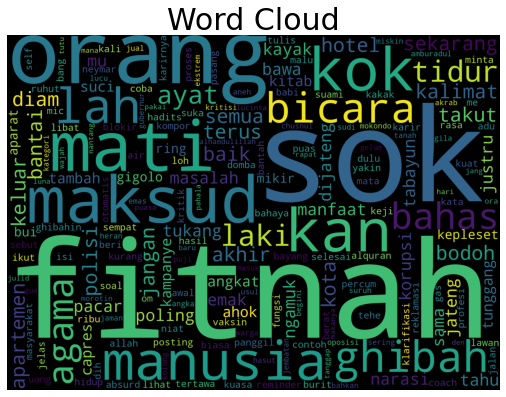

In [ ]:
from wordcloud import WordCloud,STOPWORDS
plt.figure(figsize=(30,20))
subset = data_raw_baru[data_raw_baru.hate_speech_prediction==1]
text = subset.text_clean.values
cloud_0 = WordCloud(
                          stopwords=data_stopword,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))

plt.subplot(2, 3, 1)
plt.axis('off')
plt.title("Word Cloud",fontsize=30)
plt.imshow(cloud_0)

In [ ]:
data_raw = pd.read_csv('https://raw.githubusercontent.com/kelvin2401/stki/main/bungs.csv')
data_raw.head()

,Unnamed: 0,Id,Tweet Time,Url,Tweet Text,Likes Count,Reply Count,Retweet Count,Retweeted Tweet,User Id,User Name,User Location,Follower Count,Following Count,Likes Count.1,Tweets Count
0,0,1580480802801930241,2022-10-13 08:49:21+00:00,https://twitter.com/__Bungs/status/15804808028...,📌...👇🏻 https://t.co/zey3JJSZhS https://t.co/Op...,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,1580478948684595201,2022-10-13 08:41:59+00:00,https://twitter.com/__Bungs/status/15804789486...,RT @Pra__93: 🎶When I Fall In Love \n🎙️Nat King...,0,0,5,https://twitter.com/Pra__93/status/15804746885...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,1580475761000992768,2022-10-13 08:29:19+00:00,https://twitter.com/__Bungs/status/15804757610...,Turut prihatin atas musibah ini #prayforbogor ...,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,1580475108920942592,2022-10-13 08:26:44+00:00,https://twitter.com/__Bungs/status/15804751089...,Plipres saja belum tapi udah betpikir negatif ...,2,1,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,1580473714373644288,2022-10-13 08:21:11+00:00,https://twitter.com/__Bungs/status/15804737143...,📌...🫣 https://t.co/d2OyGrskuD https://t.co/Tuh...,4,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
cols = ['Tweet Text']

In [ ]:
data_raw = data_raw[cols]

In [ ]:
data_raw.rename(columns = {'Tweet Text':'Tweet'}, inplace = True)

In [ ]:
data_raw_baru=data_raw.dropna(axis=0)

In [ ]:
data_raw_baru = data_raw_baru.append(data_raw)